In [953]:
%run neural_simulation_functions.ipynb

In [695]:
#import the python file
# once everything is good run this

#from neural_simulation_functions import *

Parameters.

In [697]:
num_neurons = 10 # try 10 just to see covariance matrices
rate = 10 
rates = np.linspace(5, 15, num_neurons)
time = 1000
num_samples = 100 # change to 100 to show Alex next time, but plot the first five trajectories or random five 
t0 = 200
time_points = np.arange(0, 1000)

In [698]:
# Simulation control parameters

# Network parameters
N_E = 1000
#gamma = 0.25                    # ratio of inhibitory to excitatory neurons
#N_I = round(gamma * N_E)
#N = N_E + N_I
epsilon = 0.5                   # Sparsity of connections.  changed from 0.1, 0.2 was fine...
#C_E = epsilon * N_E             # number of excitatory connections per neuron
#C_ext = C_E                     # external connections per neuron


# Neuron parameters
#tau = 20  * ms                  # Membrane time constant. previously 20, tried 50 it was weird, larger numbers more spikes, smaller numbers less spikes
                                # Higher Tau means slower decay, more spikes.
                                # Lower Tau means faster decay, fewer spikes
#theta = 20  * mV                # spike threshold voltage, neuron fires when hitting this value
#V_r = 10  * mV                  # reset potential, voltage neuron goes back to after firing
#tau_rp = 2  * ms                # refractory period (neuron needs to wait some time before spiking again)

# Synapse parameters
#J = 0.1 * mV                    # Synaptic strength # Previously 0.1 * mV, previouysly 0.075, 0.2 was too varied need to be more consistent
                                # larger J, stronger synaptic input, higher firing rate
                                # smaller J, weaker input, lower firing rates
#D = 1.5  * ms                   # synaptic delay, time between a pre spike and its effect on postsynap neuron

# Simulation settings
#dt = 0.1  * ms
g = 4                           # g is a good control for manipulating the firing rate, smaller numbers more spikes, bigger numbers less spikes
                                # Higher g, stronger inhibition, suppresses network activity
                                # Lower g, weaker inhibition, increase network activity
nu_ext_over_nu_thr = 1          # Previously 2, 1.2 was weird, 1 (made 2d plot nice), 0.5 not good,
# t_range = [1000, 1200]
# rate_range = [0, 200]
# rate_tick_step = 50

#nu_thr = theta / (J * C_E * tau) # minimal input rate needed to reach threshold
#nu_ext = nu_ext_over_nu_thr * nu_thr # external input rate

# adjust g and nu_ext so that nu_ext is approximately the number of spikes that are occuring, influenced by g. 
# epsilon 0.2 and g = 2.6, g = 2.8 is too much,tau = 50
# epsilon 0.5 and g = 4, tau = 20

Generating spike trains, then counting the spikes.

In [700]:
raw_spike_train = independent_poisson_processes(num_neurons, rate, time, num_samples)
# print(raw_spike_train)

In [701]:
save_spike_trains(raw_spike_train, "spike_trains.json")
loaded_spike_trains = load_spike_trains("spike_trains.json")
# print(loaded_spike_trains)

Spike trains saved to spike_trains.json


In [702]:
spike_train = standardize_units(raw_spike_train)
# print(spike_train)

In [703]:
raw_multi_rate_spike_train = multivariate_constant_poisson(num_neurons, rates, time, num_samples)

In [704]:
save_spike_trains(raw_multi_rate_spike_train, "multi_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("multi_rate_spike_trains.json")

Spike trains saved to multi_rate_spike_trains.json


In [705]:
multi_rate_spike_train = standardize_units(raw_multi_rate_spike_train)

In [706]:
# first_spike = find_nth_earliest_spike(spike_train, n=2)

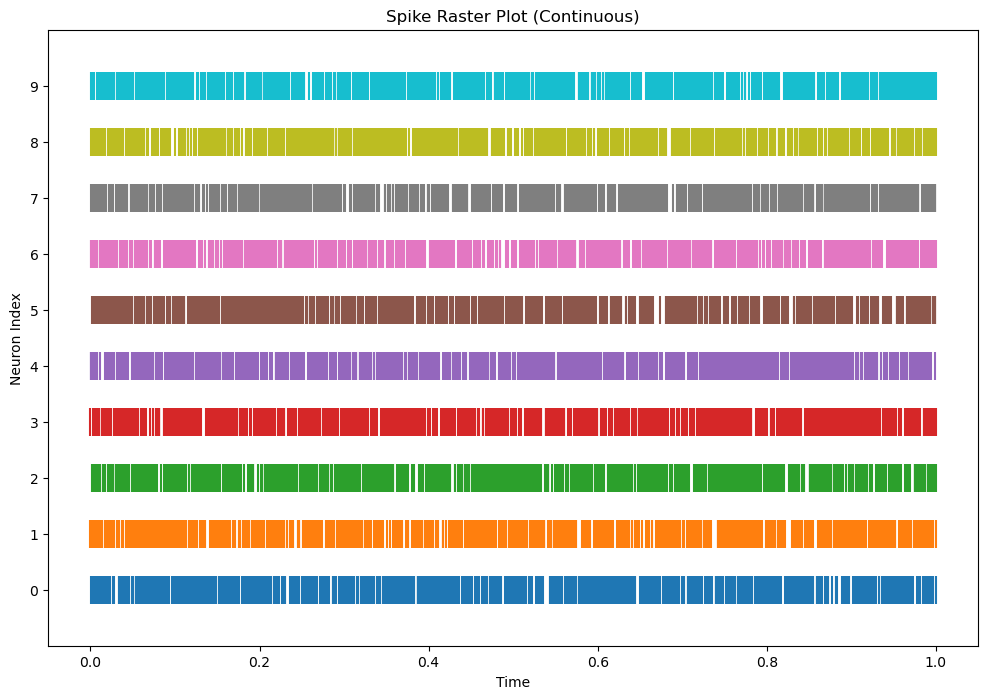

In [707]:
raster_plot(spike_train, colors=None, linelengths=None, figsize=(12,8))

In [708]:
binary_spikes = spikes_to_binary(spike_train, num_neurons, time)
multi_rate_binary_spikes = spikes_to_binary(multi_rate_spike_train, num_neurons, time)

In [709]:
spike_count = count_spikes(binary_spikes)
count = np.array(spike_count)
# print(count)
# print(count.shape)
multi_rate_spike_count = count_spikes(multi_rate_binary_spikes)
multi_rate_count = np.array(multi_rate_spike_count)

In [710]:
random_indices = np.random.choice(count.shape[0], size=5, replace=False)  # No duplicates
random_samples = count[random_indices]  # Shape: (5, neurons, time)

Getting spike trains from excitatory and inhibitory neurons, then counting the spikes.

In [712]:
# results = sim(params["g"], params["nu_ext_over_nu_thr"], params["t_range"][1] * ms, ax_spikes, ax_rates, params["rate_tick_step"], num_neurons, num_samples)
results = sim(N_E, epsilon, g, nu_ext_over_nu_thr, time, num_neurons, num_samples)

raw_excitatory_spike_trains = results['excitatory']['spike_trains']
raw_inhibitory_spike_trains = results['inhibitory']['spike_trains']
# print(raw_excitatory_spike_trains)

In [713]:
save_spike_trains(raw_excitatory_spike_trains, "spike_trains_ex.json")
loaded_spike_trains_ex = load_spike_trains("spike_trains_ex.json")

save_spike_trains(raw_inhibitory_spike_trains, "spike_trains_in.json")
loaded_spike_trains_in = load_spike_trains("spike_trains_in.json")

Spike trains saved to spike_trains_ex.json
Spike trains saved to spike_trains_in.json


In [714]:
excitatory_spike_trains = standardize_units(raw_excitatory_spike_trains)
inhibitory_spike_trains = standardize_units(raw_inhibitory_spike_trains)

#print(excitatory_spike_trains[0])
#print(inhibitory_spike_trains[0])

In [715]:
#first_spike_ex = find_nth_earliest_spike(excitatory_spike_trains, n=2)
#first_spike_in = find_nth_earliest_spike(inhibitory_spike_trains, n=2)

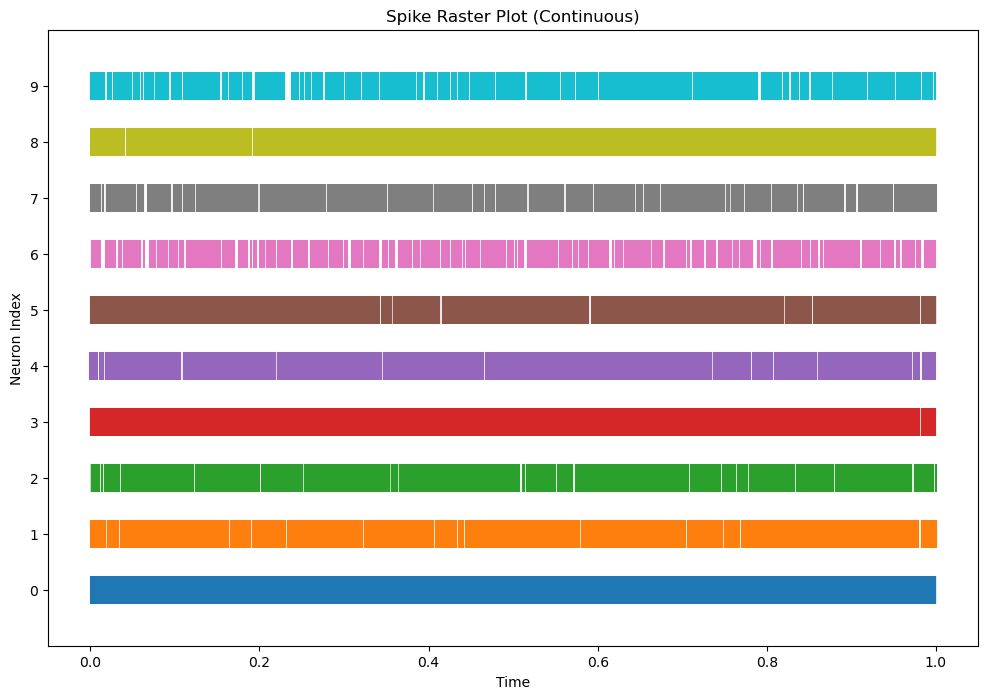

In [716]:
raster_plot(excitatory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

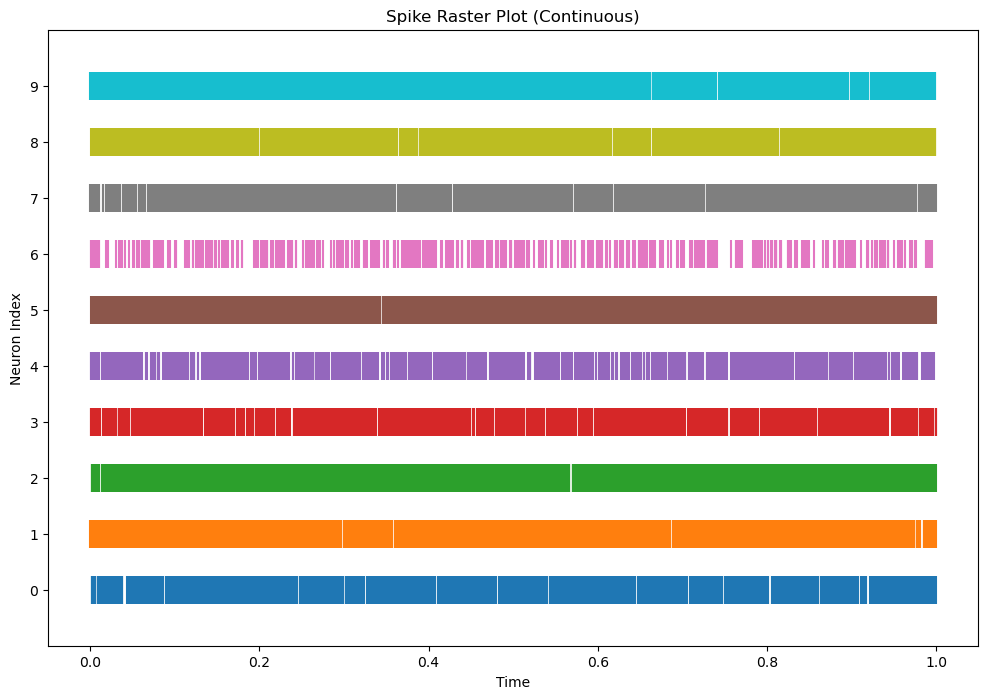

In [717]:
raster_plot(inhibitory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

In [718]:
binary_ex_spikes = spikes_to_binary(excitatory_spike_trains, num_neurons, time)
binary_in_spikes = spikes_to_binary(inhibitory_spike_trains, num_neurons, time)
# print(binary_ex_spikes[0][0]) # first sample of first neuron

In [719]:
spike_count_ex = count_spikes(binary_ex_spikes)
count_ex = np.array(spike_count_ex)
#print(spike_count_ex[0])
#print(count_ex[0])
#print(count_ex[1])
#print(count_ex.shape)

spike_count_in = count_spikes(binary_in_spikes)
count_in = np.array(spike_count_in)
#print(count_in.shape)

In [720]:
random_indices_ex = np.random.choice(count_ex.shape[0], size=5, replace=False)  # No duplicates
random_samples_ex = count_ex[random_indices_ex]  # Shape: (5, neurons, time)

random_indices_in = np.random.choice(count_in.shape[0], size=5, replace=False)  # No duplicates
random_samples_in = count_in[random_indices_in]  # Shape: (5, neurons, time)

Theoretical and Empirical stats of raw counts.

In [722]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
empirical_mean = count.mean(axis=0)
#print(empirical_mean.shape)
count_rate = empirical_mean[:, -1]
#print(count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
empirical_std_dev = np.sqrt(empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

empirical_lower_bound, empirical_upper_bound = confidence_intervals(empirical_mean, empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

In [723]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
multi_rate_empirical_mean = multi_rate_count.mean(axis=0)
#print(multi_rate_empirical_mean.shape)
multi_rate_count_rate = multi_rate_empirical_mean[:, -1]
#print(multi_rate_count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
multi_rate_empirical_std_dev = np.sqrt(multi_rate_empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

multi_rate_empirical_lower_bound, multi_rate_empirical_upper_bound = confidence_intervals(multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

In [724]:
exclude_times, global_exclude = last_zero_std_time(empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=0, recommended exclude=1
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=0, recommended exclude=1
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=0, recommended exclude=1
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=0, recommended exclude=1

Global exclude (safest): t=1


In [725]:
multi_rate_exclude_times, multi_rate_global_exclude = last_zero_std_time(multi_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=0, recommended exclude=1
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=0, recommended exclude=1
Neuron 5: last zero std at t=0, recommended exclude=1
Neuron 6: last zero std at t=0, recommended exclude=1
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [726]:
theoretical_means = calculate_theoretical_mean(count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

theoretical_std_dev = calculate_theoretical_std_dev(theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

theoretical_lower_bound, theoretical_upper_bound = confidence_intervals(theoretical_means, theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [727]:
multi_rate_theoretical_means = calculate_theoretical_mean(multi_rate_count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

multi_rate_theoretical_std_dev = calculate_theoretical_std_dev(multi_rate_theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

multi_rate_theoretical_lower_bound, multi_rate_theoretical_upper_bound = confidence_intervals(multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [728]:
res_var = variance_of_residuals(empirical_mean, theoretical_means)
#print(res_var)

In [729]:
centers = center_counts_loop(count, theoretical_means, num_samples, num_neurons)

centers_mean = np.mean(centers, axis = 0)
centers_std_dev = np.std(centers, axis = 0, ddof = 1)

centers_emp = center_counts_loop(count, empirical_mean, num_samples, num_neurons)

centers_mean_emp = np.mean(centers_emp, axis = 0)
centers_std_dev_emp = np.std(centers_emp, axis = 0, ddof = 1)

In [730]:
multi_rate_centers = center_counts_loop(multi_rate_count, multi_rate_theoretical_means, num_samples, num_neurons)

multi_rate_centers_mean = np.mean(multi_rate_centers, axis = 0)
multi_rate_centers_std_dev = np.std(multi_rate_centers, axis = 0, ddof = 1)

multi_rate_centers_emp = center_counts_loop(multi_rate_count, multi_rate_empirical_mean, num_samples, num_neurons)

multi_rate_centers_mean_emp = np.mean(multi_rate_centers_emp, axis = 0)
multi_rate_centers_std_dev_emp = np.std(multi_rate_centers_emp, axis = 0, ddof = 1)

Poisson Standardization 

In [732]:
stands = standardize_counts_loop(count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

stands_emp = standardize_counts_loop(count, empirical_mean, empirical_std_dev, num_samples, num_neurons, global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global = np.mean(stands)
standardized_std_global = np.std(stands)

standardized_mean_emp_global = np.mean(stands_emp)
standardized_std_emp_global = np.std(stands_emp)

standardized_mean = np.mean(stands, axis=0)
standardized_std = np.std(stands, axis=0, ddof = 1)

standardized_mean_emp = np.mean(stands_emp, axis = 0)
standardized_std_emp = np.std(stands_emp, axis = 0, ddof = 1)

In [733]:
multi_rate_stands = standardize_counts_loop(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

multi_rate_stands_emp = standardize_counts_loop(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

multi_rate_standardized_mean_global = np.mean(multi_rate_stands)
multi_rate_standardized_std_global = np.std(multi_rate_stands)

multi_rate_standardized_mean_emp_global = np.mean(multi_rate_stands_emp)
multi_rate_standardized_std_emp_global = np.std(multi_rate_stands_emp)

multi_rate_standardized_mean = np.mean(multi_rate_stands, axis=0)
multi_rate_standardized_std = np.std(multi_rate_stands, axis=0, ddof = 1)

multi_rate_standardized_mean_emp = np.mean(multi_rate_stands_emp, axis = 0)
multi_rate_standardized_std_emp = np.std(multi_rate_stands_emp, axis = 0, ddof = 1)

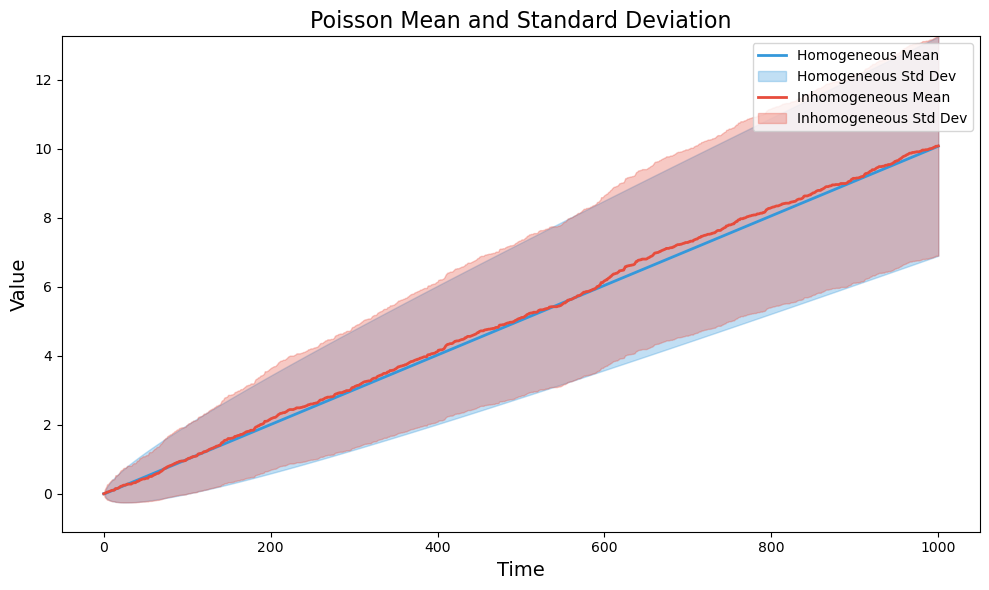

In [734]:
plot_stats(theoretical_means, empirical_mean, theoretical_std_dev, empirical_std_dev, title = 'Poisson Mean and Standard Deviation')

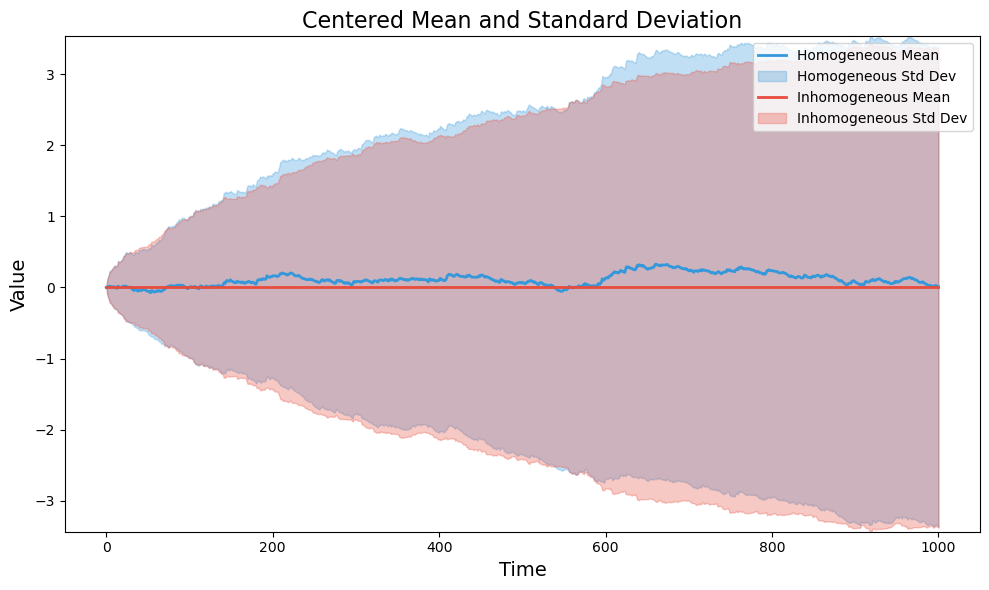

In [735]:
plot_stats(centers_mean, centers_mean_emp, centers_std_dev, centers_std_dev_emp, title = 'Centered Mean and Standard Deviation')

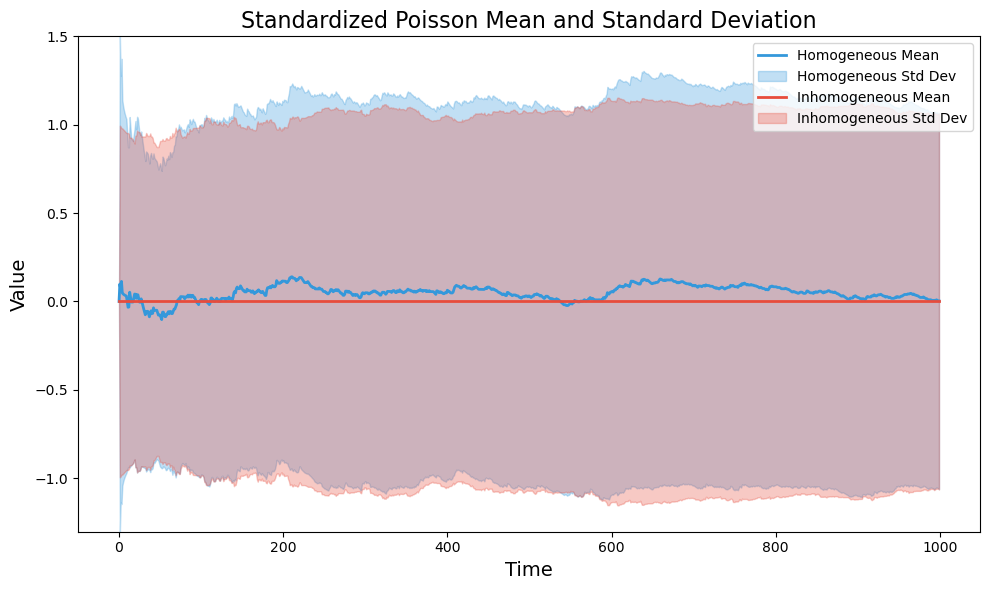

In [736]:
plot_stats(standardized_mean, standardized_mean_emp, standardized_std, standardized_std_emp, title = 'Standardized Poisson Mean and Standard Deviation')

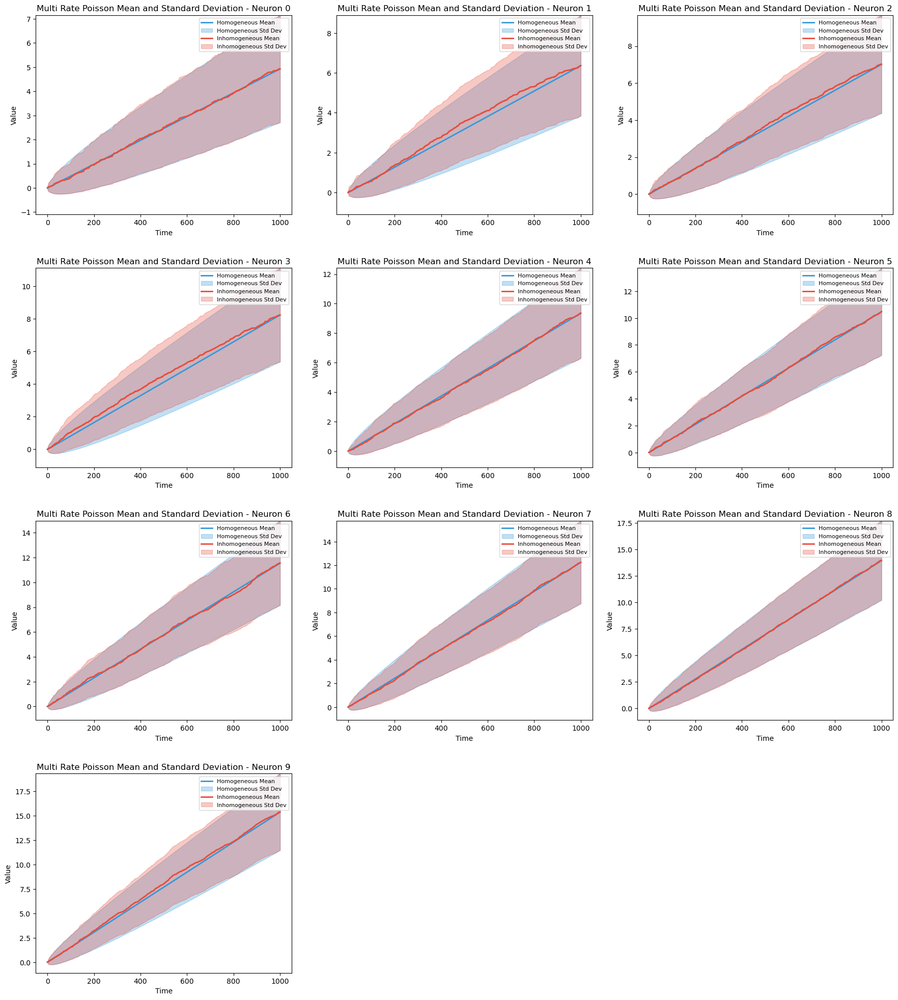

In [737]:
plot_multiple_stats(multi_rate_theoretical_means, multi_rate_empirical_mean, multi_rate_theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation')

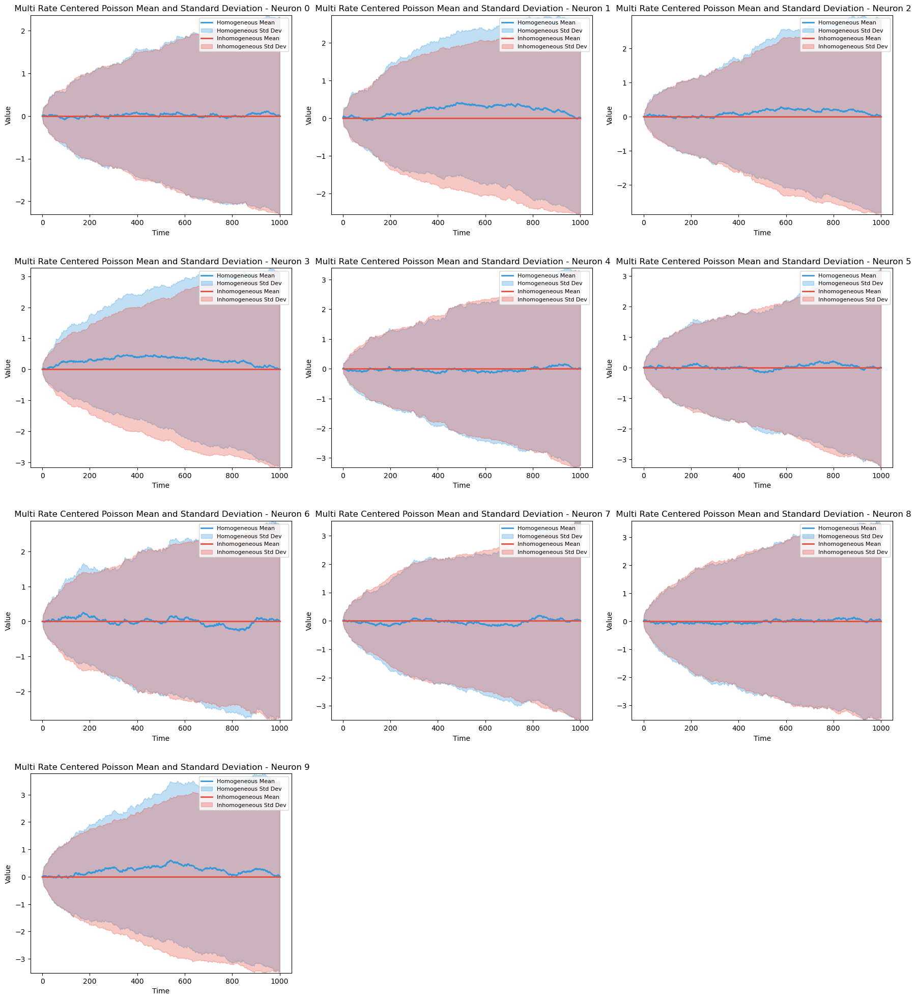

In [738]:
plot_multiple_stats(multi_rate_centers_mean, multi_rate_centers_mean_emp, multi_rate_centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Poisson Mean and Standard Deviation')

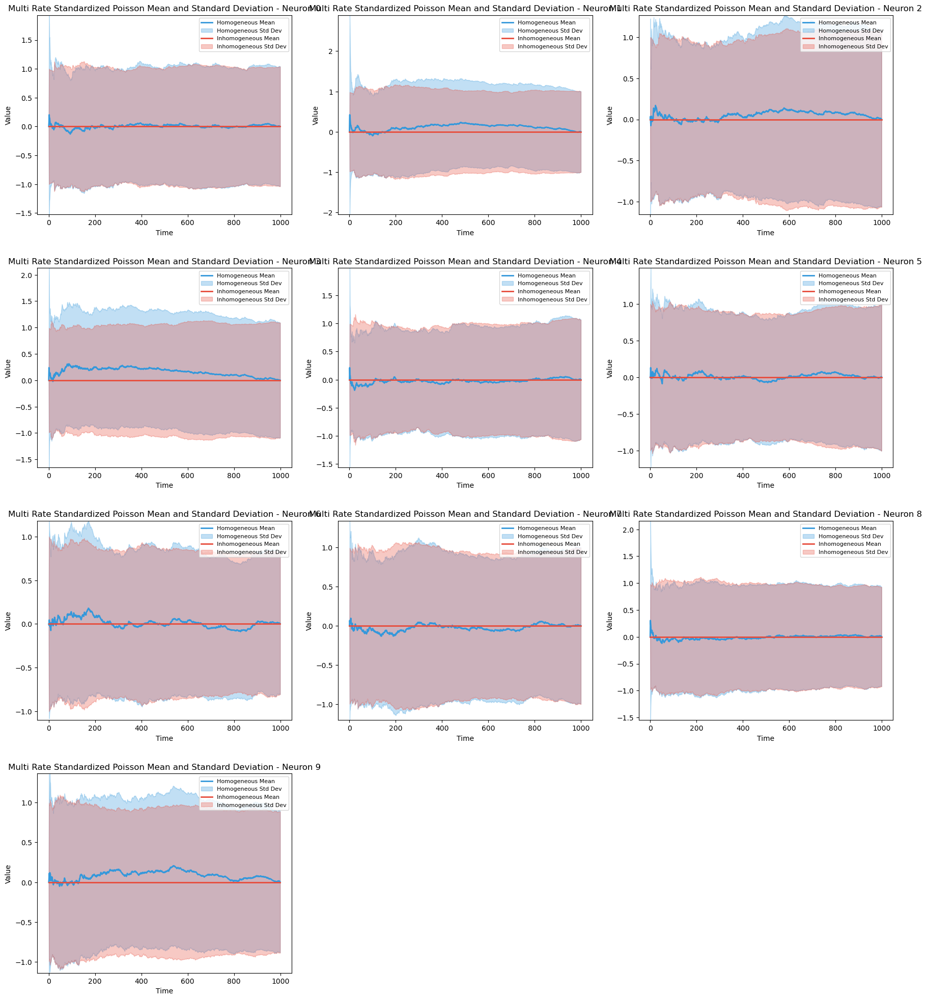

In [739]:
plot_multiple_stats(multi_rate_standardized_mean, multi_rate_standardized_mean_emp, multi_rate_standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation')

In [740]:
mean_check = check_mean_with_se(stands, expected_mean=0, confidence=0.95)
print(mean_check)

mean_check_emp = check_mean_with_se(stands_emp, expected_mean=0, confidence=0.95)
print(mean_check_emp)

{'mean': np.float64(0.008109168120234307), 'se': np.float64(0.0010075889283864261), 'CI_95%': (np.float64(0.006134327716703466), np.float64(0.010084008523765148)), 'interpretation': 'The true population mean is estimated to be between 0.01 and 0.01 (with 95% confidence).', 'is_expected_in_CI': np.False_, 'expected_mean_check': 'The expected mean (0) is OUTSIDE the 95% confidence interval.'}
{'mean': np.float64(-4.324424257679088e-18), 'se': np.float64(0.0010011015288386776), 'CI_95%': (np.float64(-0.0019621253186586263), np.float64(0.0019621253186586176)), 'interpretation': 'The true population mean is estimated to be between -0.00 and 0.00 (with 95% confidence).', 'is_expected_in_CI': np.True_, 'expected_mean_check': 'The expected mean (0) is WITHIN the 95% confidence interval.'}


In [741]:
multi_rate_mean_check = check_mean_with_se(multi_rate_stands, expected_mean=0, confidence=0.95)
print(multi_rate_mean_check)

multi_rate_mean_check_emp = check_mean_with_se(multi_rate_stands_emp, expected_mean=0, confidence=0.95)
print(multi_rate_mean_check_emp)

{'mean': np.float64(0.037504337281126635), 'se': np.float64(0.0009976642490898394), 'CI_95%': (np.float64(0.03554894891514286), np.float64(0.03945972564711041)), 'interpretation': 'The true population mean is estimated to be between 0.04 and 0.04 (with 95% confidence).', 'is_expected_in_CI': np.False_, 'expected_mean_check': 'The expected mean (0) is OUTSIDE the 95% confidence interval.'}
{'mean': np.float64(6.145234471438704e-18), 'se': np.float64(0.0009816677419340098), 'CI_95%': (np.float64(-0.0019240357500937778), np.float64(0.00192403575009379)), 'interpretation': 'The true population mean is estimated to be between -0.00 and 0.00 (with 95% confidence).', 'is_expected_in_CI': np.True_, 'expected_mean_check': 'The expected mean (0) is WITHIN the 95% confidence interval.'}


In [742]:
serialized_count = serialize_counts(stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
t_stat, p_val_mean = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat)
#print(p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_emp = serialize_counts(stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
t_stat_emp, p_val_mean_emp = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat_emp)
#print(p_val_mean_emp)

In [743]:
multi_rate_serialized_count = serialize_counts(multi_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
multi_rate_t_stat, multi_rate_p_val_mean = stats.ttest_1samp(multi_rate_serialized_count, np.mean(multi_rate_serialized_count))
#print(multi_rate_t_stat)
#print(multi_rate_p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


multi_rate_serialized_count_emp = serialize_counts(multi_rate_stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
multi_rate_t_stat_emp, multi_rate_p_val_mean_emp = stats.ttest_1samp(multi_rate_serialized_count_emp, np.mean(multi_rate_serialized_count_emp))
#print(t_stat_emp)
#print(p_val_mean_emp)

In [744]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
reshaped_stands = np.transpose(stands, (1, 0, 2)).reshape(stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
reshaped_stands_emp = np.transpose(stands_emp, (1, 0, 2)).reshape(stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [745]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
multi_rate_reshaped_stands = np.transpose(multi_rate_stands, (1, 0, 2)).reshape(multi_rate_stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
multi_rate_reshaped_stands_emp = np.transpose(multi_rate_stands_emp, (1, 0, 2)).reshape(multi_rate_stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [746]:
#print(transpose_stands.shape)
#print(transpose_stands[:,:,0])

In [747]:
#print(transpose_stands[:,:,0:3])

In [748]:
#print(reshaped_stands.shape)
#print(reshaped_stands[:,0])

In [749]:
#print(reshaped_stands[:,:5])

In [750]:
#### TESTING #####

In [751]:
test_stand = standardize_per_neuron(count, exclude=global_exclude)


=== Post-standardization checks (excluded t < 1 ) ===
Max |mean|: 1.713e-16 (should be close to 0)
Max |std - 1|: 2.220e-16 (should be close to 0)


In [752]:
#print(test_stand.shape)

In [753]:
cov_matrix = cov_standardized_data(reshaped_stands)
#print(cov_matrix.shape)
#print(cov_matrix)

In [754]:
multi_rate_cov_matrix = cov_standardized_data(multi_rate_reshaped_stands)
#print(multi_rate_cov_matrix.shape)
#print(multi_rate_cov_matrix)

In [755]:
cov_matrix_emp = cov_standardized_data(reshaped_stands_emp)
#print(cov_matrix_emp.shape)
#print(cov_matrix_emp)

In [756]:
multi_rate_cov_matrix_emp = cov_standardized_data(multi_rate_reshaped_stands_emp)
#print(cov_matrix_emp.shape)
#print(cov_matrix_emp)

array([[ 1.16214671e+00,  6.79168547e-02, -8.11327244e-02,
         4.78629246e-02,  5.02883829e-02, -1.03485017e-01,
        -7.89765355e-02,  1.76256682e-01, -1.44904780e-01,
        -3.31530842e-02],
       [ 6.79168547e-02,  9.07750663e-01, -1.07184913e-03,
        -3.53363450e-03,  7.02276744e-03, -3.41712733e-02,
        -6.33506864e-02, -9.42444808e-03,  8.55881227e-04,
         1.37142046e-02],
       [-8.11327244e-02, -1.07184913e-03,  8.27808572e-01,
        -6.72656441e-02,  3.51814864e-02, -5.59400150e-02,
        -2.34681363e-03,  2.80420178e-02,  1.94908960e-02,
         4.83992101e-02],
       [ 4.78629246e-02, -3.53363450e-03, -6.72656441e-02,
         1.11826934e+00, -9.35376914e-02,  8.63710099e-02,
        -9.32207360e-02, -2.89085139e-02, -1.99396325e-02,
        -1.56685944e-02],
       [ 5.02883829e-02,  7.02276744e-03,  3.51814864e-02,
        -9.35376914e-02,  9.15248345e-01,  2.06472263e-02,
        -3.52620915e-02,  2.40899013e-03, -2.58788716e-02,
        -9.

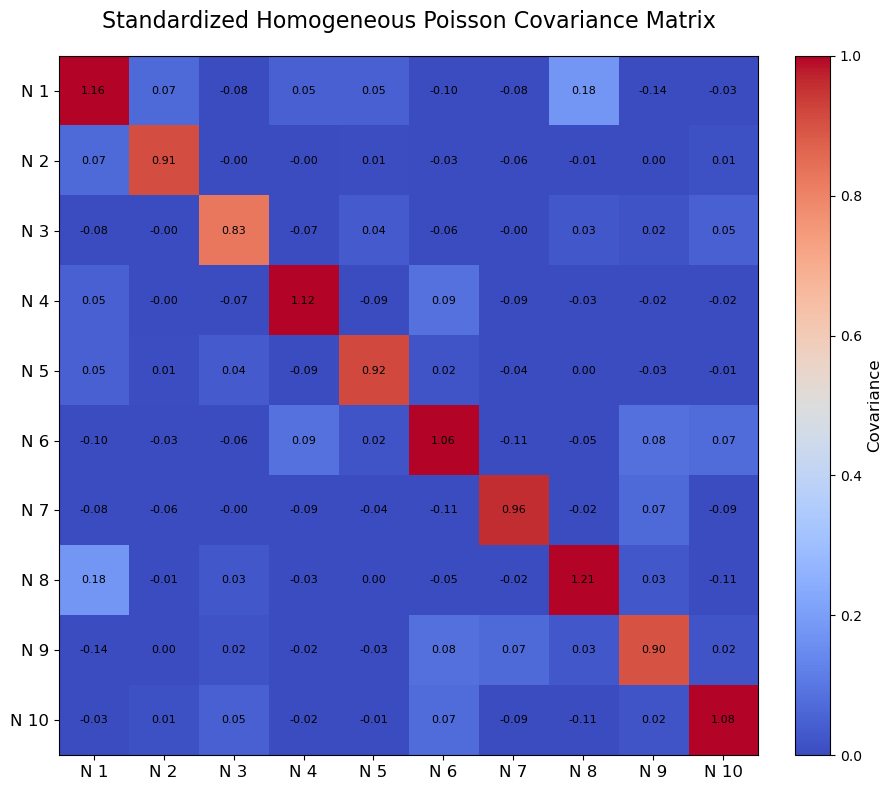

In [968]:
plot_covariance_matrix(cov_matrix, normalize=False, title='Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.12930699,  0.06894241, -0.07782724,  0.04498104,  0.0478178 ,
        -0.10537844, -0.07721941,  0.17073697, -0.14227698, -0.03253901],
       [ 0.06894241,  0.90695871, -0.00249305, -0.00250267,  0.00811621,
        -0.0327473 , -0.06251514, -0.00967026,  0.00190828,  0.01325464],
       [-0.07782724, -0.00249305,  0.86499145, -0.06481135,  0.03548444,
        -0.04797961, -0.00192339,  0.03258345,  0.01654724,  0.05020659],
       [ 0.04498104, -0.00250267, -0.06481135,  1.088153  , -0.09229349,
         0.08017518, -0.09218477, -0.02911004, -0.01913671, -0.01572612],
       [ 0.0478178 ,  0.00811621,  0.03548444, -0.09229349,  0.9148252 ,
         0.02092913, -0.03391487,  0.00351343, -0.02711255, -0.0087598 ],
       [-0.10537844, -0.0327473 , -0.04797961,  0.08017518,  0.02092913,
         1.01023392, -0.10518126, -0.04974634,  0.08551974,  0.06656555],
       [-0.07721941, -0.06251514, -0.00192339, -0.09218477, -0.03391487,
        -0.10518126,  0.94129228, -0.02095941

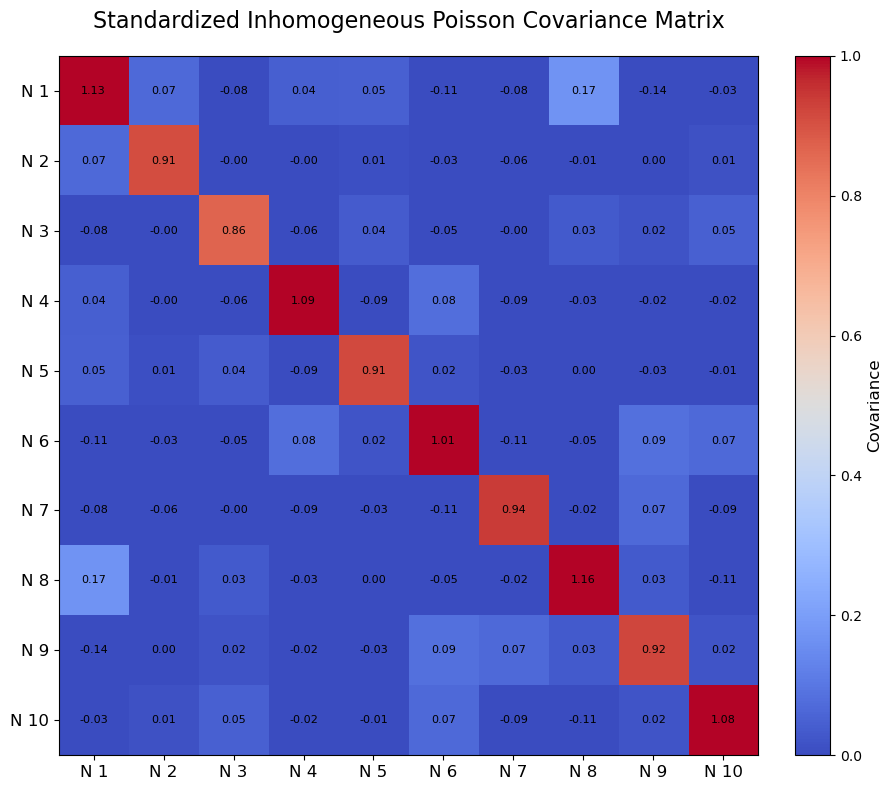

In [970]:
plot_covariance_matrix(cov_matrix_emp, normalize=False, title='Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.06317314e+00, -3.61172529e-02,  5.57174574e-02,
         1.04981792e-01,  1.05004487e-01, -2.79308821e-02,
        -1.09185812e-01, -2.18566940e-02,  7.23282719e-02,
         5.06394906e-02],
       [-3.61172529e-02,  1.19454912e+00,  1.27236736e-04,
         3.80840437e-02, -8.17086258e-02,  8.98466238e-02,
        -3.74599961e-02,  6.74144979e-03,  1.44586558e-01,
         3.24152059e-02],
       [ 5.57174574e-02,  1.27236736e-04,  1.06095909e+00,
         1.02101676e-02,  1.10245238e-01,  7.32914790e-02,
        -4.90420005e-02,  3.54904506e-02, -5.47982350e-02,
         3.26415264e-02],
       [ 1.04981792e-01,  3.80840437e-02,  1.02101676e-02,
         1.27181775e+00, -2.08888849e-02, -7.03286741e-03,
        -7.03773543e-02, -1.34294004e-01,  1.44172834e-02,
         3.40205528e-02],
       [ 1.05004487e-01, -8.17086258e-02,  1.10245238e-01,
        -2.08888849e-02,  9.51733936e-01, -6.52739297e-02,
        -6.92259650e-02, -4.80147247e-02,  3.98996359e-03,
         2.

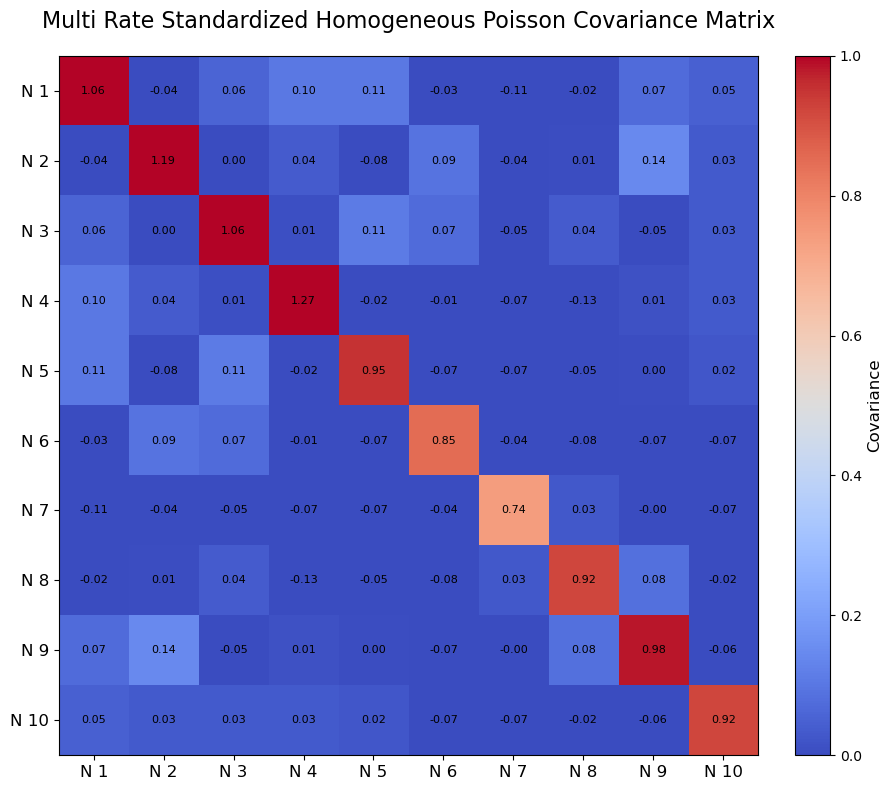

In [972]:
plot_covariance_matrix(multi_rate_cov_matrix, normalize=False, title='Multi Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.05701115, -0.03577655,  0.05429421,  0.10013871,  0.10691724,
        -0.02703921, -0.10813472, -0.02184995,  0.07268199,  0.04782615],
       [-0.03577655,  1.0920102 , -0.0073734 ,  0.01733472, -0.07768465,
         0.086141  , -0.03524011,  0.00687982,  0.14171603,  0.02031361],
       [ 0.05429421, -0.0073734 ,  1.02443698,  0.00215526,  0.11051715,
         0.07176009, -0.04729788,  0.03526479, -0.05486118,  0.02711896],
       [ 0.10013871,  0.01733472,  0.00215526,  1.1173697 , -0.01671578,
        -0.00731921, -0.07145723, -0.1276727 ,  0.01620531,  0.01733752],
       [ 0.10691724, -0.07768465,  0.11051715, -0.01671578,  0.97151526,
        -0.06563669, -0.06866252, -0.0495207 ,  0.00238314,  0.02602757],
       [-0.02703921,  0.086141  ,  0.07176009, -0.00731921, -0.06563669,
         0.84005993, -0.03589325, -0.08244801, -0.07429123, -0.0703552 ],
       [-0.10813472, -0.03524011, -0.04729788, -0.07145723, -0.06866252,
        -0.03589325,  0.7275301 ,  0.03226699

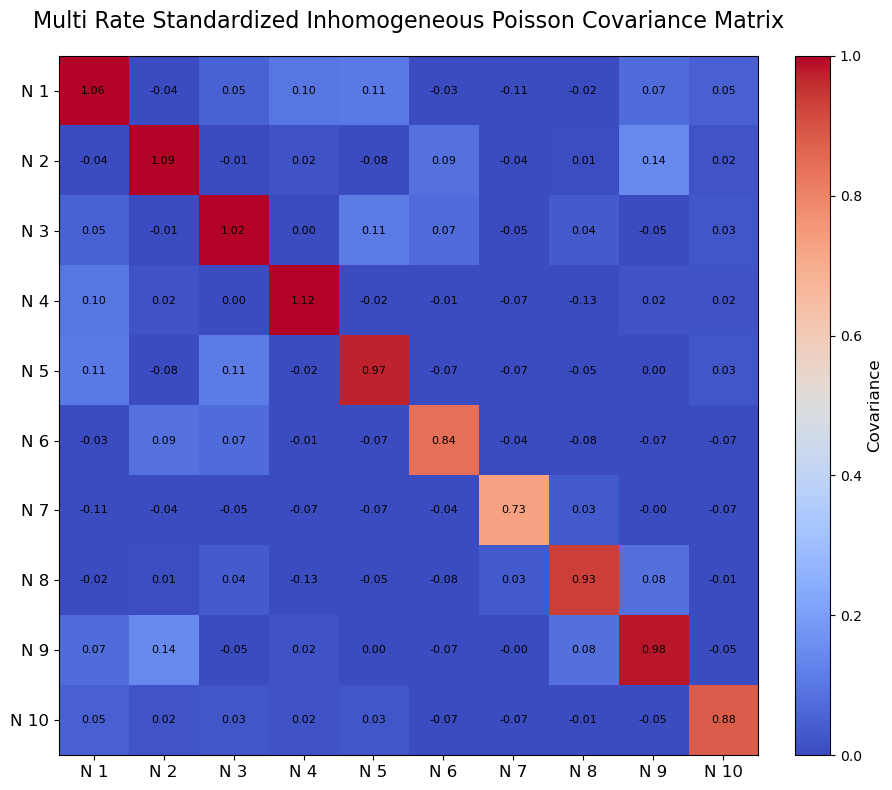

In [974]:
plot_covariance_matrix(multi_rate_cov_matrix_emp, normalize=False, title='Multi Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

In [761]:
#### TESTING END #####

In [762]:
#hotelling_result = hotelling_t2_test(reshaped_stands, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result)
#hotelling_result_emp = hotelling_t2_test(reshaped_stands_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_emp)

In [763]:
#good_result = stats.goodness_of_fit(stats.norm, serialized_count, statistic='ad', n_mc_samples=9999, rng=None)
# Anderson-Darling test (good for normality)
# Number of Monte Carlo samples
# Random number generator (None for fresh results)

#print(f"Statistic: {good_result.statistic}")
#print(f"P-value: {good_result.pvalue}")
#print(f"Location (mean): {good_result.fit_result.params.loc}")
#print(f"Scale (std dev): {good_result.fit_result.params.scale}")

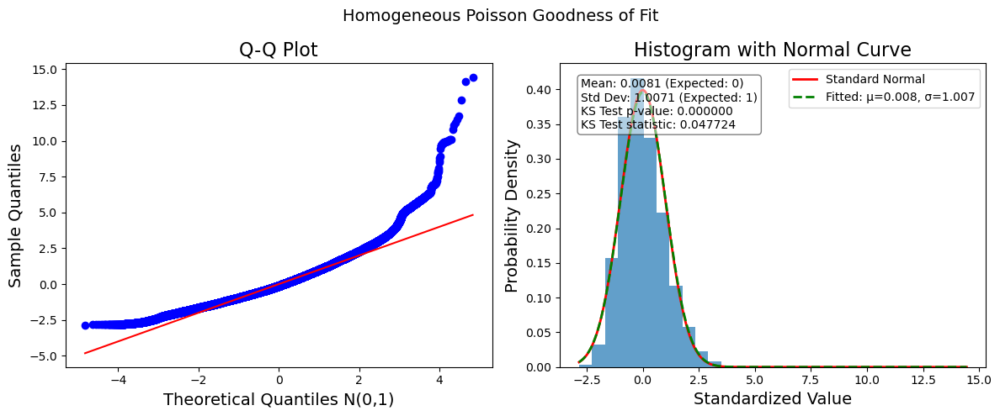

In [764]:
goodness, fig = analyze_poisson_goodness_of_fit(serialized_count, plot_title="Homogeneous Poisson Goodness of Fit", sample_limit=5000)

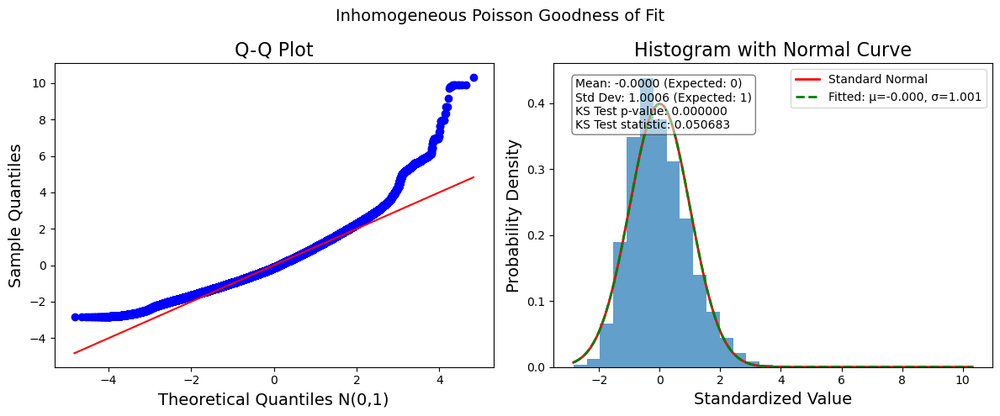

In [765]:
goodness_emp, fig_emp = analyze_poisson_goodness_of_fit(serialized_count_emp, plot_title="Inhomogeneous Poisson Goodness of Fit", sample_limit=5000)

In [766]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)
#rv = multivariate_normal(mean = [0,0], cov = cov_matrix, allow_singular = False)
#rv_emp = multivariate_normal(mean = [0,0], cov = cov_matrix_emp, allow_singular=False)
#print(rv)
#print(rv_emp)

# this is creating its own model, from this we can test if the data has goodness of fit

In [767]:
#cov_matrix, diagonal_ones = covariance_diagonal(reshaped_stands, tol=1e-8)
#print(cov_matrix)
#print(diagonal_ones)
#cov_matrix_emp, diagonal_ones_emp = covariance_diagonal(reshaped_stands_emp, tol=1e-8)
#print(cov_matrix_emp)
#print(diagonal_ones_emp)

Theoretical and Empirical stats of excitatory counts.

In [769]:
# empirical_mean_ex = empirical_means(count_ex)
empirical_mean_ex = count_ex.mean(axis=0)
#print(empirical_mean_ex)
#print(empirical_mean_ex.shape)
count_rate_ex = empirical_mean_ex[:, -1]

# empirical_std_dev_ex = std_dev_empirical_mean(empirical_mean_ex, num_samples, count_ex)
#empirical_std_dev_ex = count_ex.std(axis=0, ddof=1)
empirical_std_dev_ex = np.sqrt(empirical_mean_ex)
#print(empirical_std_dev_ex)
#print(empirical_std_dev_ex.shape)

empirical_lower_bound_ex, empirical_upper_bound_ex = confidence_intervals(empirical_mean_ex, empirical_std_dev_ex, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_ex)
# print(empirical_upper_bound_sim_ex)

In [770]:
exclude_times_ex, global_exclude_ex = last_zero_std_time(empirical_std_dev_ex, verbose=True)

Neuron 0: last zero std at t=0, recommended exclude=1
Neuron 1: last zero std at t=0, recommended exclude=1
Neuron 2: last zero std at t=0, recommended exclude=1
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=1, recommended exclude=2
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=2


In [771]:
theoretical_means_sim_ex = calculate_theoretical_mean(count_rate_ex, time)
#print(theoretical_means_sim_ex)
#print(theoretical_means_sim_ex.shape)

theoretical_std_dev_sim_ex = calculate_theoretical_std_dev(theoretical_means_sim_ex)
#print(theoretical_std_dev_sim_ex)
#print(theoretical_std_dev_sim_ex.shape)

theoretical_lower_bound_sim_ex, theoretical_upper_bound_sim_ex = confidence_intervals(theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_ex)
# print(theoretical_upper_bound_sim_ex)

In [772]:
res_var_ex = variance_of_residuals(empirical_mean_ex, theoretical_means_sim_ex)
#print(res_var_ex)

In [773]:
stands_ex = standardize_counts_loop(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, num_neurons, exclude = 1)
#print(stands_ex)
#print(stands_ex.shape)

stands_ex_emp = standardize_counts_loop(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, num_neurons, global_exclude_ex)
#print(stands_ex_emp)
#print(stands_ex_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_ex = np.mean(stands_ex)
standardized_std_global_ex = np.std(stands_ex)

standardized_mean_emp_global_ex = np.mean(stands_ex_emp)
standardized_std_emp_global_ex = np.std(stands_ex_emp)

standardized_mean_ex = np.mean(stands_ex, axis=0)
standardized_std_ex = np.std(stands_ex, axis=0, ddof = 1)

standardized_mean_ex_emp = np.mean(stands_ex_emp, axis = 0)
standardized_std_ex_emp = np.std(stands_ex_emp, axis = 0, ddof = 1)

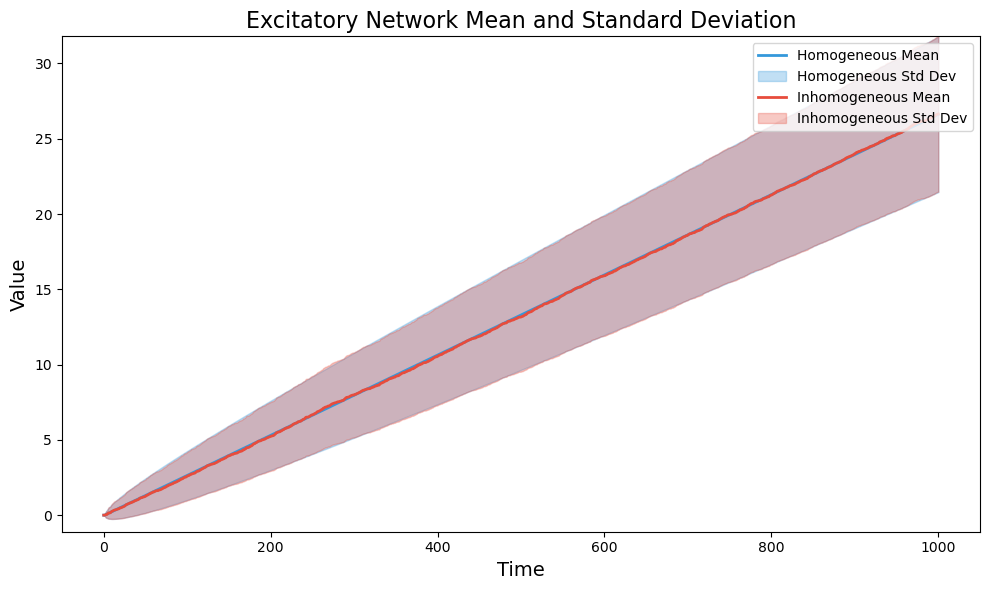

In [774]:
plot_stats(theoretical_means_sim_ex, empirical_mean_ex, theoretical_std_dev_sim_ex, empirical_std_dev_ex, title = 'Excitatory Network Mean and Standard Deviation')

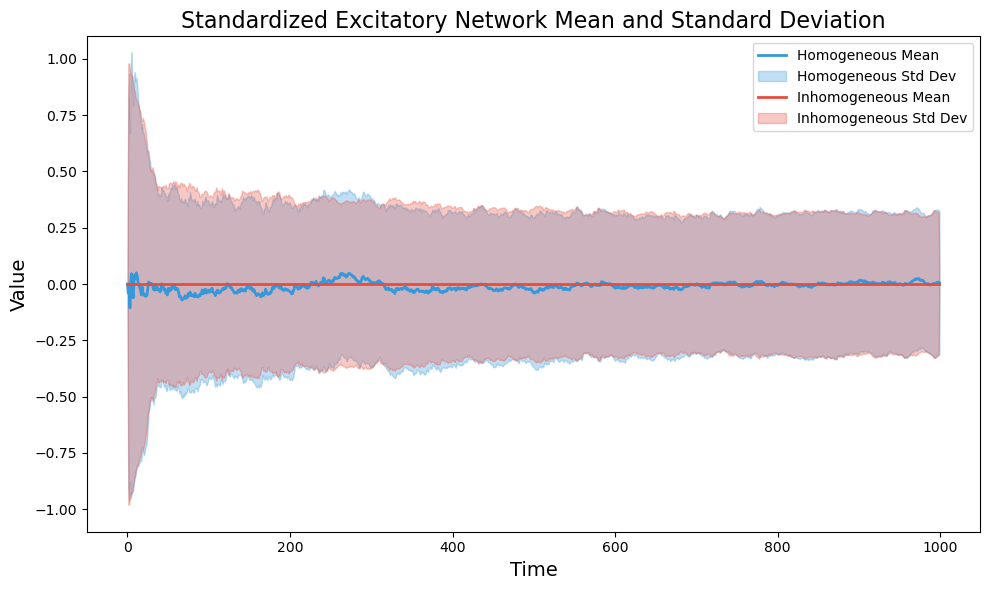

In [775]:
plot_stats(standardized_mean_ex, standardized_mean_ex_emp, standardized_std_ex, standardized_std_ex_emp, title = 'Standardized Excitatory Network Mean and Standard Deviation')

In [776]:
mean_check_ex = check_mean_with_se(stands_ex, expected_mean=0, confidence=0.95)
#print(mean_check_ex)

mean_check_ex_emp = check_mean_with_se(stands_ex_emp, expected_mean=0, confidence=0.95)
#print(mean_check_ex_emp)

In [777]:
serialized_count_ex = serialize_counts(stands_ex) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex.shape)
#print(np.mean(serialized_count_ex))
t_stat_ex, p_val_mean_ex = stats.ttest_1samp(serialized_count_ex, np.mean(serialized_count_ex))
#print(t_stat_ex)
#print(p_val_mean_ex)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables

serialized_count_ex_emp = serialize_counts(stands_ex_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex_emp.shape)
#print(np.mean(serialized_count_ex_emp))
t_stat_ex_emp, p_val_mean_ex_emp = stats.ttest_1samp(serialized_count_ex_emp, np.mean(serialized_count_ex_emp))
#print(t_stat_ex_emp)
#print(p_val_mean_ex_emp)

In [778]:
#reshaped_stands_ex = np.reshape(stands_ex, (-1, stands_ex.shape[1]), order='F')
reshaped_stands_ex = np.transpose(stands_ex, (1, 0, 2)).reshape(stands_ex.shape[1], -1)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)

#could change the values from num_samples, num_neurons, time to 10 by large number, could transpose it
# make sure coviariance matrix is using row data, don't use np.cov because it throws away the mean
# covariance is the data and the transpose of the data divided sqrt(n-1), lookup how covariance is calculated and make it by hand.
# try to iterate over samples, as in each time point, 

# reshaped_stands_ex_emp = np.reshape(stands_ex_emp, (-1, stands_ex_emp.shape[1]), order='F')
reshaped_stands_ex_emp = np.transpose(stands_ex_emp, (1, 0, 2)).reshape(stands_ex_emp.shape[1], -1)
#print(stands_ex_emp.shape)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)
#print(stands_ex[:,:,0])
#print(reshaped_stands[:,0])
#print(stands_ex_emp[:,:,0].shape)
#print(stands_ex_emp[:10,:,0])
#print(reshaped_stands_ex_emp.shape)
#print(reshaped_stands_ex_emp[:10,:])

In [779]:
transpose_stands_ex = np.transpose(stands_ex, (1, 0, 2))
#print(transpose_stands_ex[:,:,0:3])

In [780]:
#print(reshaped_stands_ex[:,:5])

In [781]:
#print("Time point 0:", stands_ex[:,:,0])
#print("Time point 1:", stands_ex[:,:,1])
#print("Time point 100:", stands_ex[:,:,100])

In [782]:
cov_matrix_ex = cov_standardized_data(reshaped_stands_ex)
cov_matrix_ex_emp = cov_standardized_data(reshaped_stands_ex_emp)

array([[ 0.13307945,  0.04529843,  0.02047727,  0.03407645,  0.03046693,
         0.02848358,  0.02770848,  0.0221068 ,  0.01748655,  0.04543628],
       [ 0.04529843,  0.20349227,  0.02289563,  0.03782049,  0.05565329,
         0.05168498,  0.00393521,  0.05005708,  0.0343296 ,  0.05851259],
       [ 0.02047727,  0.02289563,  0.22448682,  0.00102785,  0.03365146,
         0.01396748,  0.02938227,  0.04538979,  0.03109615, -0.00132914],
       [ 0.03407645,  0.03782049,  0.00102785,  0.12485219,  0.01998535,
         0.02102491,  0.04058515,  0.01105022,  0.024483  ,  0.0030462 ],
       [ 0.03046693,  0.05565329,  0.03365146,  0.01998535,  0.23956678,
         0.04805964,  0.02356104,  0.05267579,  0.01842302,  0.02519308],
       [ 0.02848358,  0.05168498,  0.01396748,  0.02102491,  0.04805964,
         0.20350109,  0.04739469,  0.05832101,  0.01942541,  0.03315906],
       [ 0.02770848,  0.00393521,  0.02938227,  0.04058515,  0.02356104,
         0.04739469,  0.41432729,  0.05057601

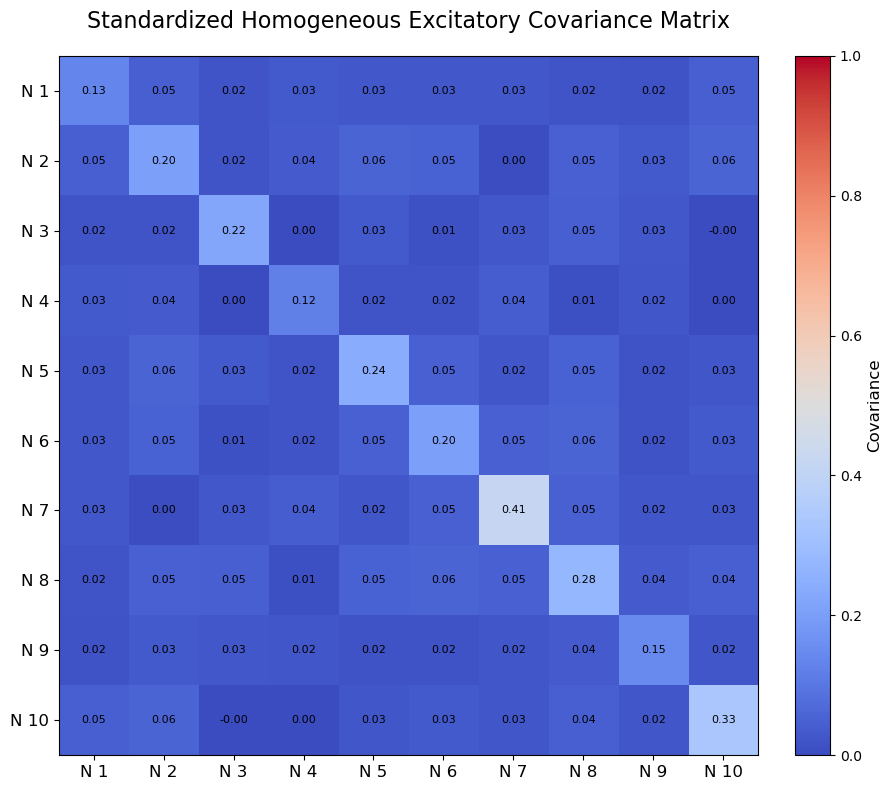

In [976]:
plot_covariance_matrix(cov_matrix_ex, normalize=False, title="Standardized Homogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.13322035,  0.04547645,  0.02015786,  0.03404868,  0.03072545,
         0.02838584,  0.02705462,  0.02217494,  0.01728614,  0.04461362],
       [ 0.04547645,  0.1998251 ,  0.02198056,  0.03810601,  0.05588123,
         0.0514153 ,  0.00378778,  0.0509664 ,  0.03461222,  0.05917696],
       [ 0.02015786,  0.02198056,  0.19592164,  0.00172016,  0.03248069,
         0.01196592,  0.02677567,  0.04512465,  0.03104158, -0.00154387],
       [ 0.03404868,  0.03810601,  0.00172016,  0.12599414,  0.02013346,
         0.02142394,  0.03972335,  0.01092745,  0.02434338,  0.0019168 ],
       [ 0.03072545,  0.05588123,  0.03248069,  0.02013346,  0.23646326,
         0.04804245,  0.02309563,  0.05242643,  0.01861396,  0.02388348],
       [ 0.02838584,  0.0514153 ,  0.01196592,  0.02142394,  0.04804245,
         0.19457912,  0.04658175,  0.05887562,  0.01963951,  0.03305485],
       [ 0.02705462,  0.00378778,  0.02677567,  0.03972335,  0.02309563,
         0.04658175,  0.40690434,  0.050425  

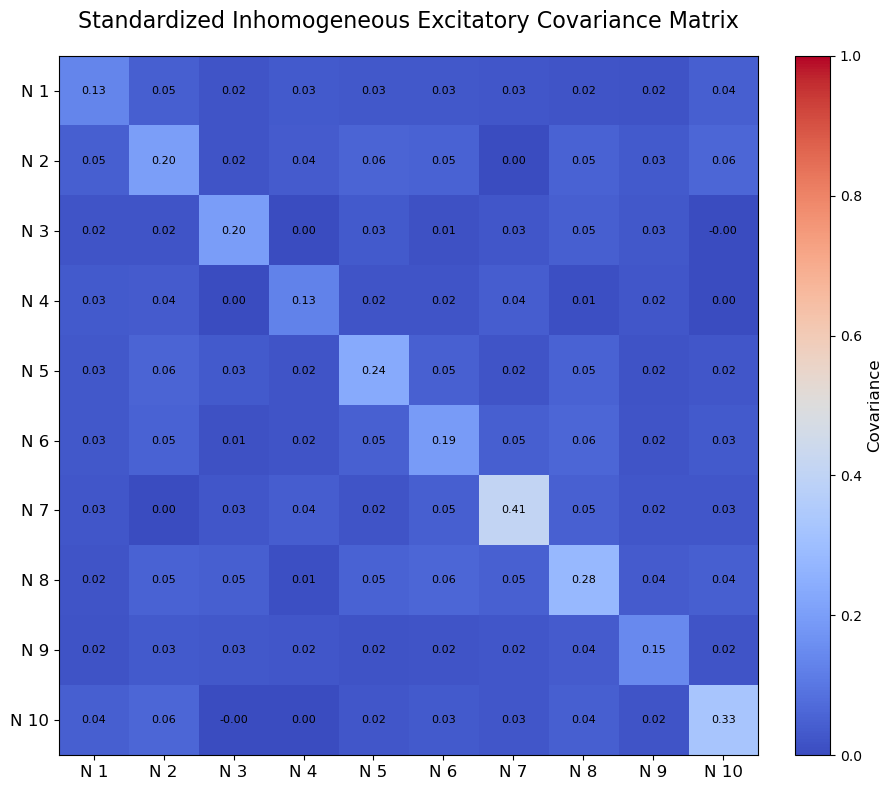

In [978]:
plot_covariance_matrix(cov_matrix_ex_emp, normalize=False, title="Standardized Inhomogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [785]:
#hotelling_result_ex = hotelling_t2_test(reshaped_stands_ex, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex)
#hotelling_result_ex_emp = hotelling_t2_test(reshaped_stands_ex_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex_emp)

In [786]:
#cov_matrix_ex, diagonal_ones_ex = covariance_diagonal(reshaped_stands_ex, tol=1e-8)
#print(cov_matrix_ex)
#print(diagonal_ones_ex)
#cov_matrix_ex_emp, diagonal_ones_ex_emp = covariance_diagonal(reshaped_stands_ex_emp, tol=1e-8)
#print(cov_matrix_ex_emp)
#print(diagonal_ones_ex_emp)

In [787]:
#### TESTING #####
#plot_covariance_matrix(reshaped_data, normalize=False, title="Excitatory Theoretical Covariance Matrix", cmap='coolwarm', annot=True)

In [788]:
#### TESTING ####
#plot_covariance_matrix(reshaped_data_emp, normalize=False, title="Excitatory Empirical Covariance Matrix", cmap='coolwarm', annot=True)

In [789]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_ex = multivariate_normal(mean = theoretical_means_sim_ex, cov = cov_matrix_ex, allow_singular=allow_singular)
# rv_ex_emp = multivariate_normal(mean = empirical_mean_ex, cov = cov_matrix_ex_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

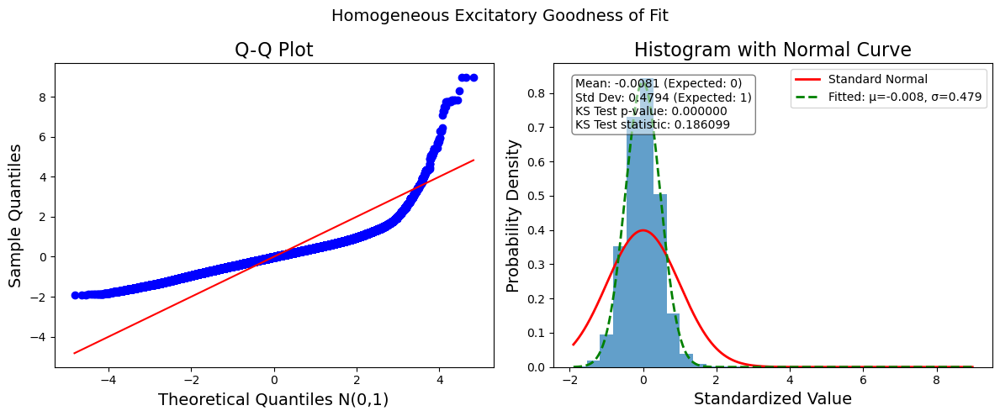

In [790]:
goodness_ex, fig_ex = analyze_poisson_goodness_of_fit(serialized_count_ex, plot_title="Homogeneous Excitatory Goodness of Fit", sample_limit=5000)

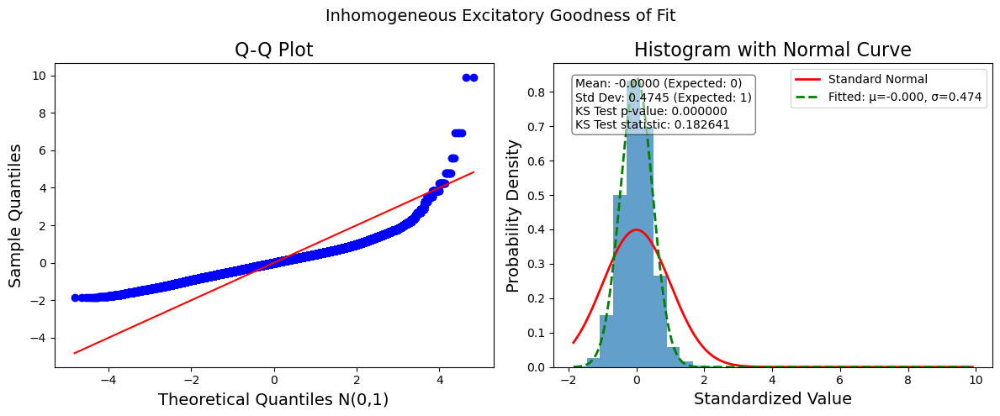

In [791]:
goodness_ex_emp, fig_ex_emp = analyze_poisson_goodness_of_fit(serialized_count_ex_emp, plot_title="Inhomogeneous Excitatory Goodness of Fit", sample_limit=5000)

Theoretical and Empirical stats of inhibitory counts.

In [793]:
# empirical_mean_in = empirical_means(count_in)
empirical_mean_in = count_in.mean(axis=0)
#print(empirical_mean_in)
#print(empirical_mean_in.shape)
count_rate_in = empirical_mean_in[:, -1]

#empirical_std_dev_in = std_dev_empirical_mean(empirical_mean_in, num_samples, count_in)
#empirical_std_dev_in = count_in.std(axis=0, ddof=1)
empirical_std_dev_in = np.sqrt(empirical_mean_in)
#print(empirical_std_dev_in)
#print(empirical_std_dev_in.shape)

empirical_lower_bound_in, empirical_upper_bound_in = confidence_intervals(empirical_mean_in, empirical_std_dev_in, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_in)
# print(empirical_upper_bound_sim_in)

In [794]:
exclude_times_in, global_exclude_in = last_zero_std_time(empirical_std_dev_in, verbose=True)

Neuron 0: last zero std at t=0, recommended exclude=1
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=0, recommended exclude=1
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=0, recommended exclude=1
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=0, recommended exclude=1
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [795]:
theoretical_means_sim_in = calculate_theoretical_mean(count_rate_in, time)
#print(theoretical_means_sim_in)
#print(theoretical_means_sim_in.shape)

theoretical_std_dev_sim_in = calculate_theoretical_std_dev(theoretical_means_sim_in)
#print(theoretical_std_dev_sim_in)
#print(theoretical_std_dev_sim_in.shape)

theoretical_lower_bound_sim_in, theoretical_upper_bound_sim_in = confidence_intervals(theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_in)
# print(theoretical_upper_bound_sim_in)

In [796]:
res_var_in = variance_of_residuals(empirical_mean_in, theoretical_means_sim_in)
#print(res_var_in)

In [797]:
stands_in = standardize_counts_loop(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, num_neurons, exclude = 1)
#print(stands_in)
#print(stands_in.shape)

stands_in_emp = standardize_counts_loop(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, num_neurons, global_exclude_in)
#print(stands_in_emp)
#print(stands_in_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_in = np.mean(stands_in)
standardized_std_global_in = np.std(stands_in)

standardized_mean_emp_global_in = np.mean(stands_in_emp)
standardized_std_emp_global_in = np.std(stands_in_emp)

standardized_mean_in = np.mean(stands_in, axis=0)
standardized_std_in = np.std(stands_in, axis=0, ddof = 1)

standardized_mean_in_emp = np.mean(stands_in_emp, axis = 0)
standardized_std_in_emp = np.std(stands_in_emp, axis = 0, ddof = 1)

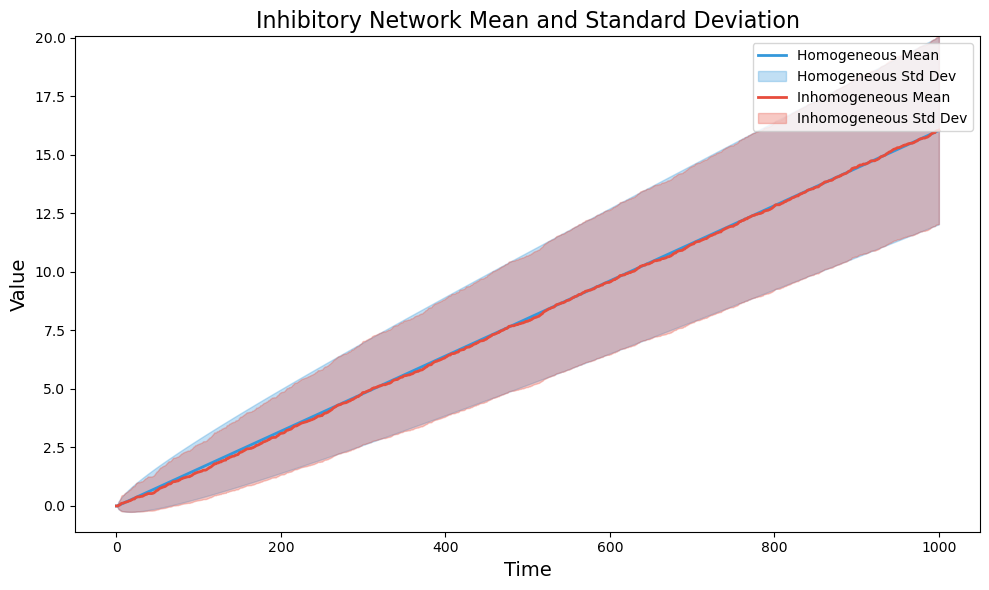

In [798]:
plot_stats(theoretical_means_sim_in , empirical_mean_in, theoretical_std_dev_sim_in, empirical_std_dev_in, title = 'Inhibitory Network Mean and Standard Deviation')

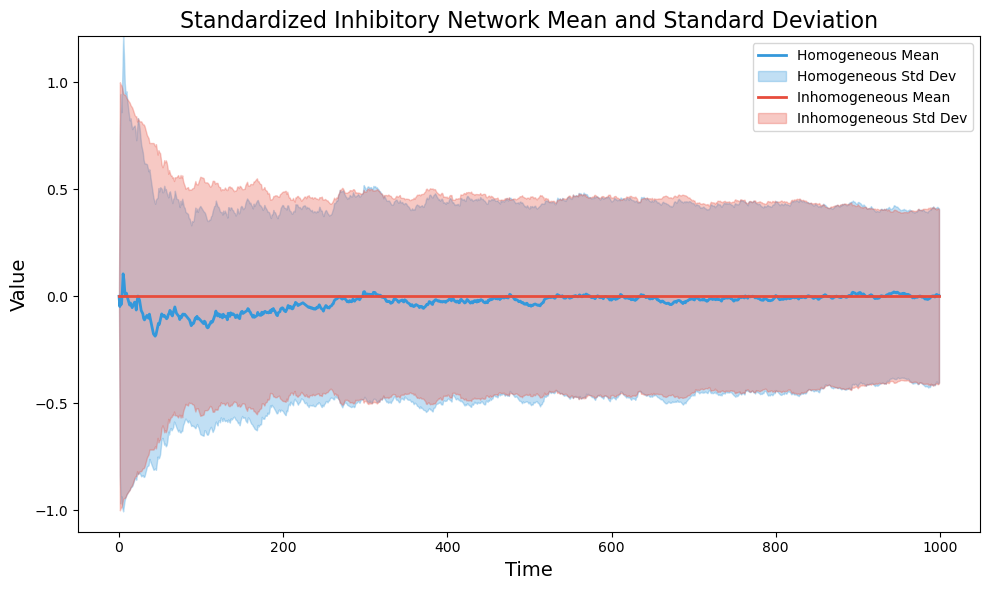

In [799]:
plot_stats(standardized_mean_in, standardized_mean_in_emp, standardized_std_in, standardized_std_in_emp, title = 'Standardized Inhibitory Network Mean and Standard Deviation')

In [800]:
mean_check_in = check_mean_with_se(stands_in, expected_mean=0, confidence=0.95)
#print(mean_check_in)

mean_check_in_emp = check_mean_with_se(stands_in_emp, expected_mean=0, confidence=0.95)
#print(mean_check_in_emp)

In [801]:
serialized_count_in = serialize_counts(stands_in) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in.shape)
#print(np.mean(serialized_count_in))
t_stat_in, p_val_mean_in = stats.ttest_1samp(serialized_count_in, np.mean(serialized_count_in))
#print(t_stat_in)
#print(p_val_mean_in)
    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_in_emp = serialize_counts(stands_in_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in_emp.shape)
#print(np.mean(serialized_count_in_emp))
t_stat_in_emp, p_val_mean_in_emp = stats.ttest_1samp(serialized_count_in_emp, np.mean(serialized_count_in_emp))
#print(t_stat_in_emp)
#print(p_val_mean_in_emp)

In [802]:
#reshaped_stands_in = np.reshape(stands_in, (-1, stands_in.shape[1]), order='F')
reshaped_stands_in = np.transpose(stands_in, (1, 0, 2)).reshape(stands_in.shape[1], -1)
#print(stands_in.shape)
#print(reshaped_stands_in.shape)

#reshaped_stands_in_emp = np.reshape(stands_in_emp, (-1, stands_in_emp.shape[1]), order='F')
reshaped_stands_in_emp = np.transpose(stands_in_emp, (1, 0, 2)).reshape(stands_in_emp.shape[1], -1)
#print(stands_in_emp.shape)
#print(reshaped_stands_in_emp.shape)

In [803]:
cov_matrix_in = cov_standardized_data(reshaped_stands_in)
cov_matrix_in_emp = cov_standardized_data(reshaped_stands_in_emp)

array([[ 0.23258716,  0.02574123,  0.01595502,  0.00759254,  0.0268706 ,
         0.04455161,  0.01520632,  0.01910415,  0.03564395,  0.02002643],
       [ 0.02574123,  0.15837439,  0.04336554,  0.00075984,  0.02988166,
         0.01970627,  0.01211036, -0.00122881,  0.01339459,  0.01705365],
       [ 0.01595502,  0.04336554,  0.15131528,  0.02035669,  0.0293725 ,
         0.01564982, -0.02001583,  0.00545958,  0.00196047,  0.02421572],
       [ 0.00759254,  0.00075984,  0.02035669,  0.3149224 ,  0.00764615,
         0.00703095, -0.03908705,  0.02437228,  0.01578696,  0.00633388],
       [ 0.0268706 ,  0.02988166,  0.0293725 ,  0.00764615,  0.39858931,
         0.00836092,  0.05830303,  0.00095811,  0.03438538,  0.01247452],
       [ 0.04455161,  0.01970627,  0.01564982,  0.00703095,  0.00836092,
         0.13654817,  0.02008367,  0.00700684,  0.01270102,  0.00403704],
       [ 0.01520632,  0.01211036, -0.02001583, -0.03908705,  0.05830303,
         0.02008367,  0.70700684,  0.00142018

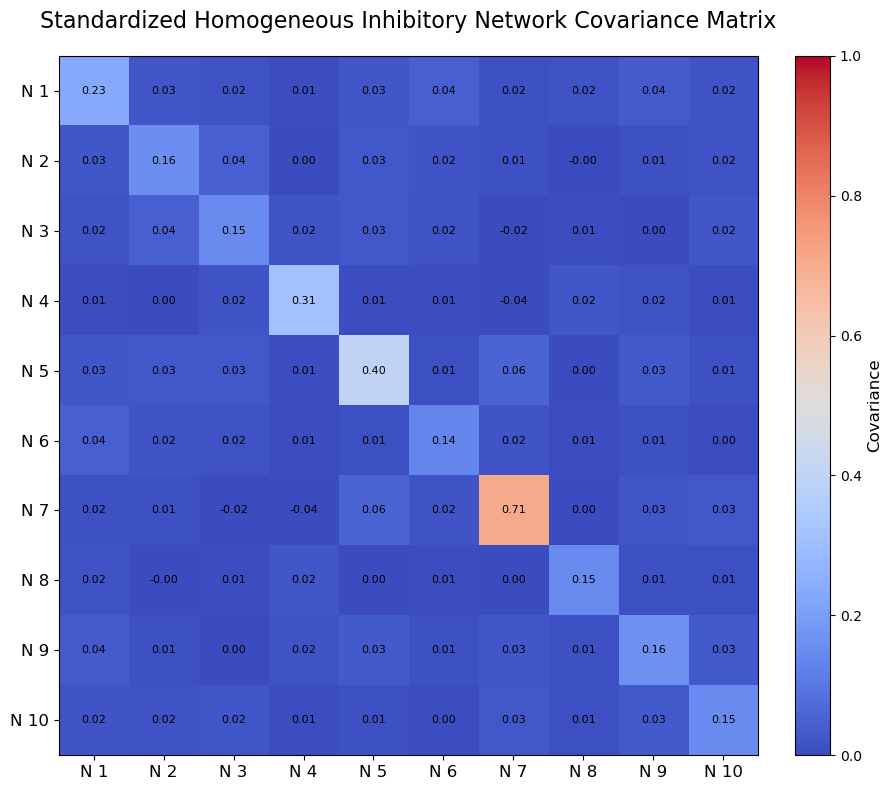

In [980]:
plot_covariance_matrix(cov_matrix_in, normalize=False, title="Standardized Homogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 2.36848055e-01,  2.61496268e-02,  1.51818267e-02,
         8.60303391e-03,  2.70111785e-02,  4.48696216e-02,
         1.62161655e-02,  1.85713208e-02,  3.62020924e-02,
         2.00862511e-02],
       [ 2.61496268e-02,  1.54846014e-01,  4.35305732e-02,
         2.07304708e-04,  2.91752737e-02,  1.96991883e-02,
         1.11236819e-02, -7.98606016e-04,  1.34600160e-02,
         1.64529951e-02],
       [ 1.51818267e-02,  4.35305732e-02,  1.53743628e-01,
         2.06735900e-02,  2.89485271e-02,  1.50476557e-02,
        -1.73747090e-02,  4.50232463e-03,  1.86062097e-03,
         2.43410533e-02],
       [ 8.60303391e-03,  2.07304708e-04,  2.06735900e-02,
         3.01264773e-01,  7.11915445e-03,  7.99146092e-03,
        -3.98261287e-02,  2.51928839e-02,  1.59934528e-02,
         5.16788985e-03],
       [ 2.70111785e-02,  2.91752737e-02,  2.89485271e-02,
         7.11915445e-03,  3.82060176e-01,  8.09511472e-03,
         5.29990960e-02,  1.67418138e-03,  3.44517320e-02,
         1.

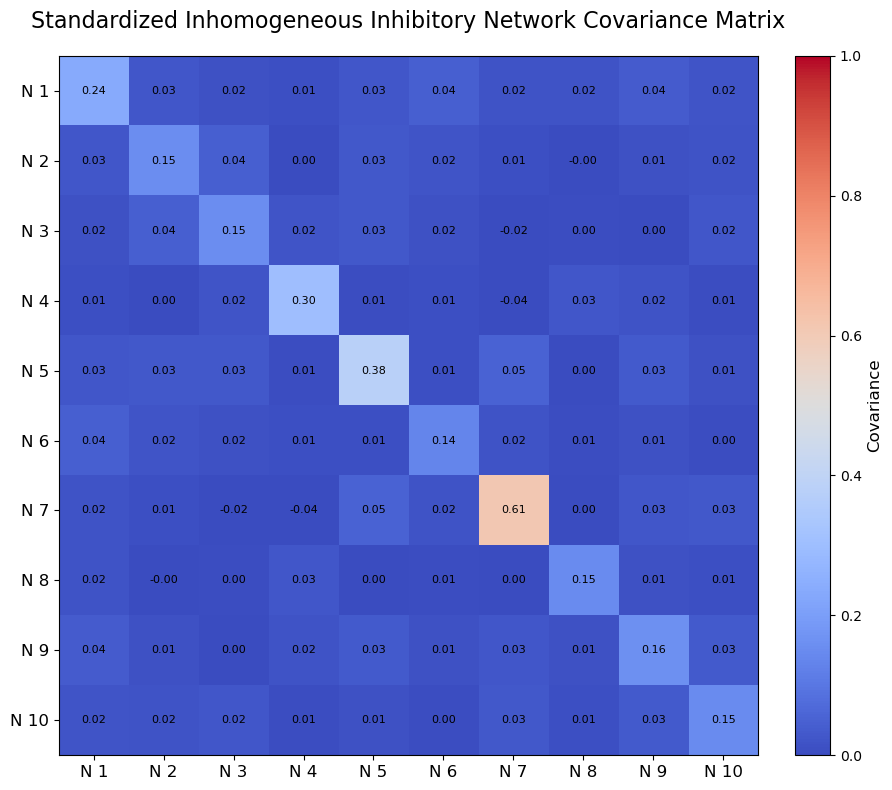

In [982]:
plot_covariance_matrix(cov_matrix_in_emp, normalize=False, title="Standardized Inhomogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [806]:
#hotelling_result_in = hotelling_t2_test(reshaped_stands_in, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in)
#hotelling_result_in_emp = hotelling_t2_test(reshaped_stands_in_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in_emp)

In [807]:
#cov_matrix_in, diagonal_ones_in = covariance_diagonal(reshaped_stands_in, tol=1e-8)
#print(cov_matrix_in)
#print(diagonal_ones_in)
#cov_matrix_in_emp, diagonal_ones_in_emp = covariance_diagonal(reshaped_stands_in_emp, tol=1e-8)
#print(cov_matrix_in_emp)
#print(diagonal_ones_in_emp)

In [808]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_in = multivariate_normal(mean = theoretical_means_sim_in, cov = cov_matrix_in, allow_singular=allow_singular)
# rv_in_emp = multivariate_normal(mean = empirical_mean_in, cov = cov_matrix_in_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

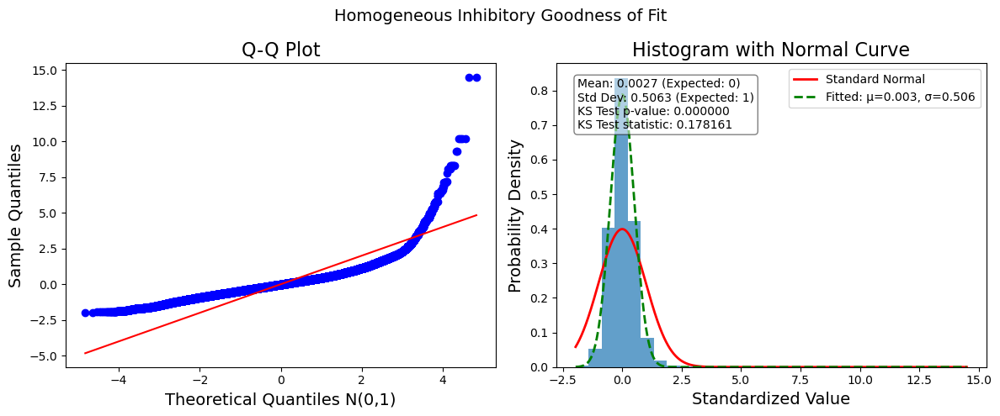

In [809]:
goodness_in, fig_in = analyze_poisson_goodness_of_fit(serialized_count_in, plot_title="Homogeneous Inhibitory Goodness of Fit", sample_limit=5000)

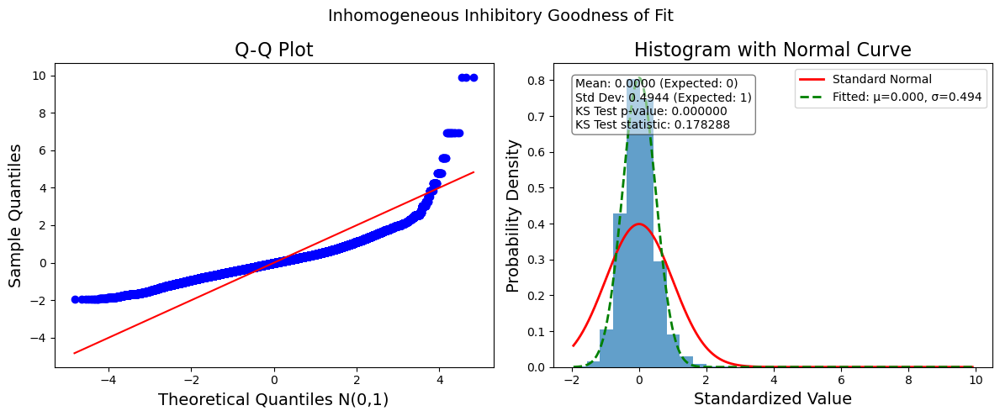

In [810]:
goodness_in_emp, fig_in_emp = analyze_poisson_goodness_of_fit(serialized_count_in_emp, plot_title="Inhomogeneous Inhibitory Goodness of Fit", sample_limit=5000)

Balanced Excitatory and Inhibitory Experiments

In [812]:
# Original excitatory and inhibitory data shapes
print(reshaped_stands_ex.shape)
print(reshaped_stands_in.shape)

print(reshaped_stands_ex_emp.shape)
print(reshaped_stands_in_emp.shape)

(10, 99900)
(10, 99900)
(10, 99800)
(10, 99900)


In [813]:
balanced_data, labels, types = create_balanced_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nBalanced dataset shape: {balanced_data.shape}")
print(f"Neuron labels: {labels}")
print(f"Neuron types: {types}")

balanced_data_emp, labels_emp, types_emp = create_balanced_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nBalanced Empirical dataset shape: {balanced_data_emp.shape}")
print(f"Neuron Empirical labels: {labels_emp}")
print(f"Neuron Empirical types: {types_emp}")


Balanced dataset shape: (10, 99900)
Neuron labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']

Balanced Empirical dataset shape: (10, 99800)
Neuron Empirical labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron Empirical types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']


In [814]:
cov_matrix_balance = cov_standardized_data(balanced_data)
cov_matrix_balance_emp = cov_standardized_data(balanced_data_emp)

array([[0.13307945, 0.04529843, 0.02047727, 0.03407645, 0.03046693,
        0.03945383, 0.03363481, 0.03140285, 0.00448093, 0.01908039],
       [0.04529843, 0.20349227, 0.02289563, 0.03782049, 0.05565329,
        0.03419063, 0.05010674, 0.03430983, 0.02514676, 0.03504136],
       [0.02047727, 0.02289563, 0.22448682, 0.00102785, 0.03365146,
        0.01612502, 0.01752982, 0.03427109, 0.03142188, 0.02478635],
       [0.03407645, 0.03782049, 0.00102785, 0.12485219, 0.01998535,
        0.01179468, 0.02614544, 0.01811194, 0.0122006 , 0.01262505],
       [0.03046693, 0.05565329, 0.03365146, 0.01998535, 0.23956678,
        0.04846256, 0.0376737 , 0.01458347, 0.00887397, 0.03212663],
       [0.03945383, 0.03419063, 0.01612502, 0.01179468, 0.04846256,
        0.23258716, 0.02574123, 0.01595502, 0.00759254, 0.0268706 ],
       [0.03363481, 0.05010674, 0.01752982, 0.02614544, 0.0376737 ,
        0.02574123, 0.15837439, 0.04336554, 0.00075984, 0.02988166],
       [0.03140285, 0.03430983, 0.0342710

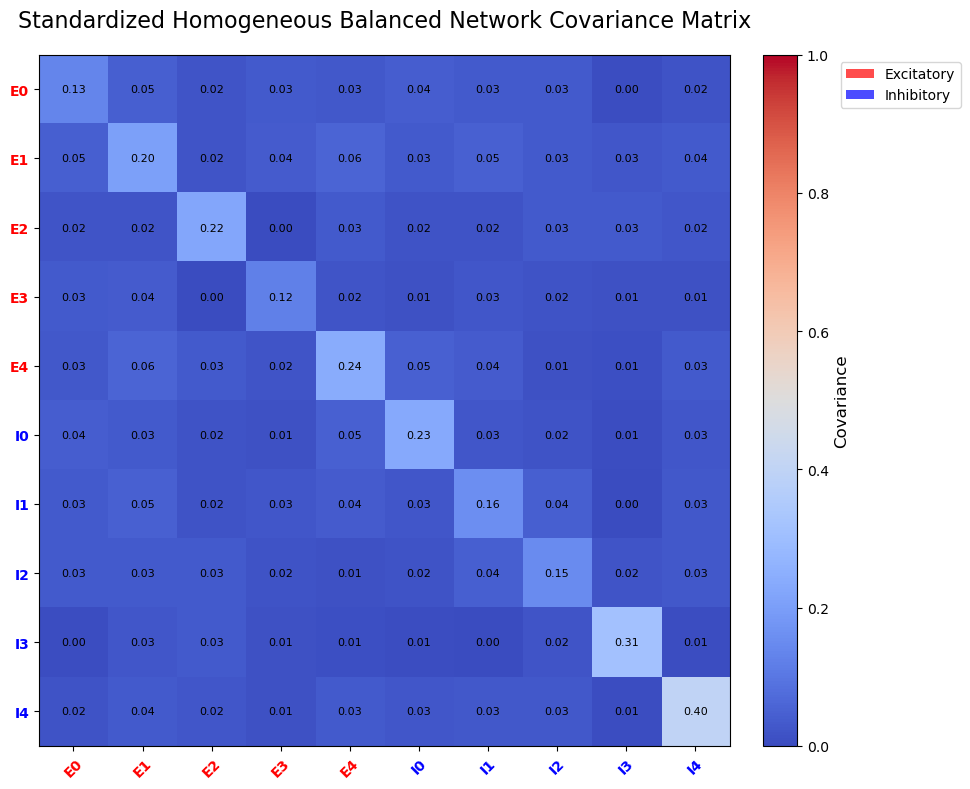

In [963]:
plot_covariance_matrix(cov_matrix_balance, normalize=False, title="Standardized Homogeneous Balanced Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels)

array([[ 1.33220352e-01,  4.54764547e-02,  2.01578606e-02,
         3.40486766e-02,  3.07254497e-02,  2.91909824e-02,
         2.76621627e-02,  2.31612297e-02,  5.87084080e-04,
         8.62263116e-03],
       [ 4.54764547e-02,  1.99825103e-01,  2.19805624e-02,
         3.81060130e-02,  5.58812265e-02,  2.57837494e-02,
         4.31935019e-02,  2.76862362e-02,  1.74729577e-02,
         2.40906673e-02],
       [ 2.01578606e-02,  2.19805624e-02,  1.95921636e-01,
         1.72016225e-03,  3.24806901e-02,  9.73742696e-03,
         5.72760929e-03,  2.71818957e-02,  2.00216822e-02,
         1.28939838e-02],
       [ 3.40486766e-02,  3.81060130e-02,  1.72016225e-03,
         1.25994138e-01,  2.01334563e-02,  1.39644734e-03,
         2.20505913e-02,  1.24639606e-02,  6.80542352e-03,
         7.01012330e-03],
       [ 3.07254497e-02,  5.58812265e-02,  3.24806901e-02,
         2.01334563e-02,  2.36463257e-01,  3.45127695e-02,
         3.15145114e-02,  6.73447460e-03, -9.19961753e-04,
         2.

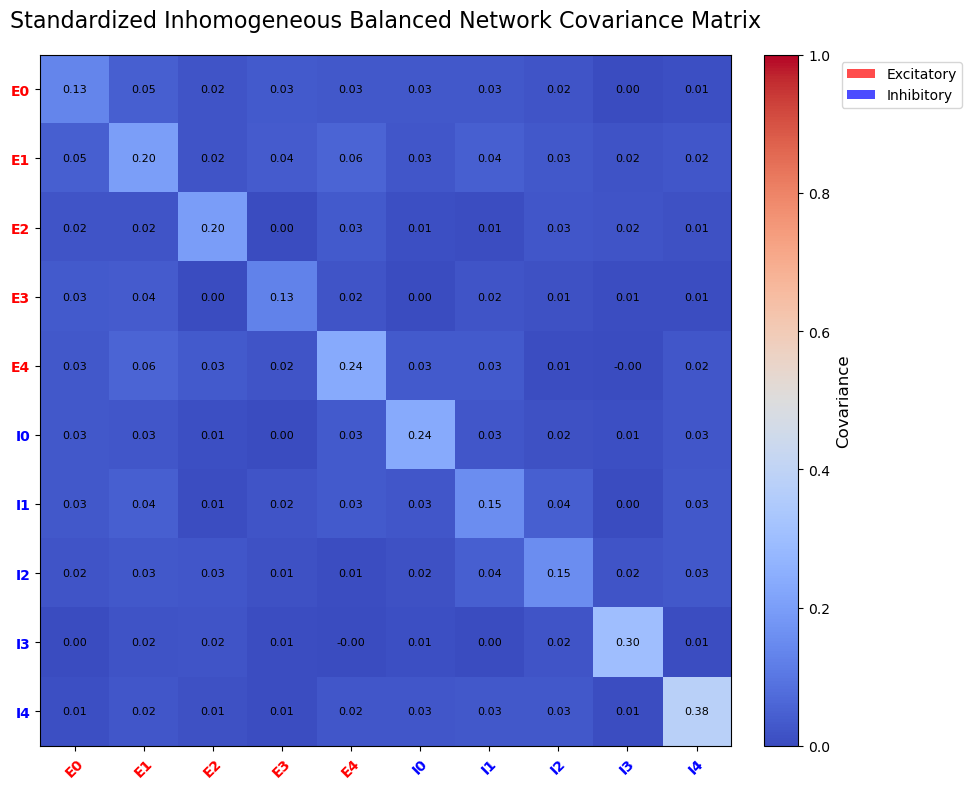

In [965]:
plot_covariance_matrix(cov_matrix_balance_emp, normalize=False, title="Standardized Inhomogeneous Balanced Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels_emp)

In [860]:
interleaved_data, int_labels, int_types = create_interleaved_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nInterleaved dataset shape: {interleaved_data.shape}")
print(f"Neuron labels: {int_labels}")
print(f"Neuron types: {int_types}")

interleaved_data_emp, int_labels_emp, int_types_emp = create_interleaved_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nInterleaved Empirical dataset shape: {interleaved_data_emp.shape}")
print(f"Neuron Empirical labels: {int_labels_emp}")
print(f"Neuron Empirical types: {int_types_emp}")


Interleaved dataset shape: (10, 99900)
Neuron labels: ['E0', 'I0', 'E1', 'I1', 'E2', 'I2', 'E3', 'I3', 'E4', 'I4']
Neuron types: ['E', 'I', 'E', 'I', 'E', 'I', 'E', 'I', 'E', 'I']

Interleaved Empirical dataset shape: (10, 99800)
Neuron Empirical labels: ['E0', 'I0', 'E1', 'I1', 'E2', 'I2', 'E3', 'I3', 'E4', 'I4']
Neuron Empirical types: ['E', 'I', 'E', 'I', 'E', 'I', 'E', 'I', 'E', 'I']


In [861]:
cov_matrix_interleaved = cov_standardized_data(interleaved_data)
cov_matrix_interleaved_emp = cov_standardized_data(interleaved_data_emp)

array([[0.13307945, 0.03945383, 0.04529843, 0.03363481, 0.02047727,
        0.03140285, 0.03407645, 0.00448093, 0.03046693, 0.01908039],
       [0.03945383, 0.23258716, 0.03419063, 0.02574123, 0.01612502,
        0.01595502, 0.01179468, 0.00759254, 0.04846256, 0.0268706 ],
       [0.04529843, 0.03419063, 0.20349227, 0.05010674, 0.02289563,
        0.03430983, 0.03782049, 0.02514676, 0.05565329, 0.03504136],
       [0.03363481, 0.02574123, 0.05010674, 0.15837439, 0.01752982,
        0.04336554, 0.02614544, 0.00075984, 0.0376737 , 0.02988166],
       [0.02047727, 0.01612502, 0.02289563, 0.01752982, 0.22448682,
        0.03427109, 0.00102785, 0.03142188, 0.03365146, 0.02478635],
       [0.03140285, 0.01595502, 0.03430983, 0.04336554, 0.03427109,
        0.15131528, 0.01811194, 0.02035669, 0.01458347, 0.0293725 ],
       [0.03407645, 0.01179468, 0.03782049, 0.02614544, 0.00102785,
        0.01811194, 0.12485219, 0.0122006 , 0.01998535, 0.01262505],
       [0.00448093, 0.00759254, 0.0251467

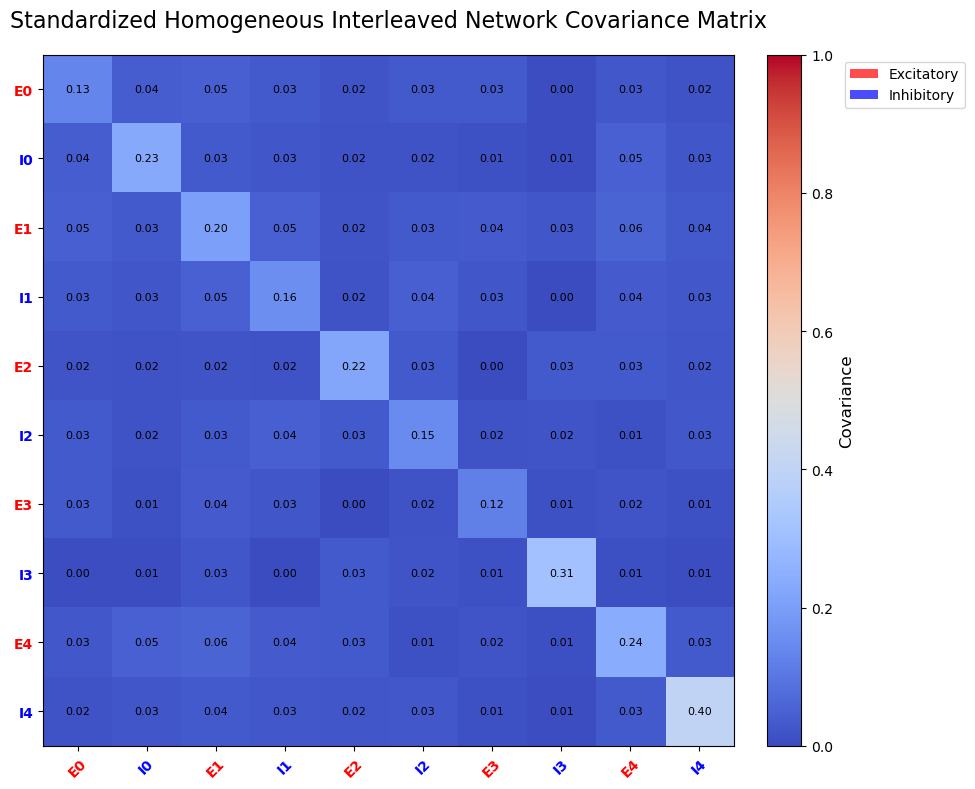

In [961]:
plot_covariance_matrix(cov_matrix_interleaved, normalize=False, title="Standardized Homogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels)

array([[ 1.33220352e-01,  2.91909824e-02,  4.54764547e-02,
         2.76621627e-02,  2.01578606e-02,  2.31612297e-02,
         3.40486766e-02,  5.87084080e-04,  3.07254497e-02,
         8.62263116e-03],
       [ 2.91909824e-02,  2.37028747e-01,  2.57837494e-02,
         2.61310142e-02,  9.73742696e-03,  1.51069477e-02,
         1.39644734e-03,  8.71501151e-03,  3.45127695e-02,
         2.71394051e-02],
       [ 4.54764547e-02,  2.57837494e-02,  1.99825103e-01,
         4.31935019e-02,  2.19805624e-02,  2.76862362e-02,
         3.81060130e-02,  1.74729577e-02,  5.58812265e-02,
         2.40906673e-02],
       [ 2.76621627e-02,  2.61310142e-02,  4.31935019e-02,
         1.54949693e-01,  5.72760929e-03,  4.34891118e-02,
         2.20505913e-02,  3.17982470e-04,  3.15145114e-02,
         2.93145414e-02],
       [ 2.01578606e-02,  9.73742696e-03,  2.19805624e-02,
         5.72760929e-03,  1.95921636e-01,  2.71818957e-02,
         1.72016225e-03,  2.00216822e-02,  3.24806901e-02,
         1.

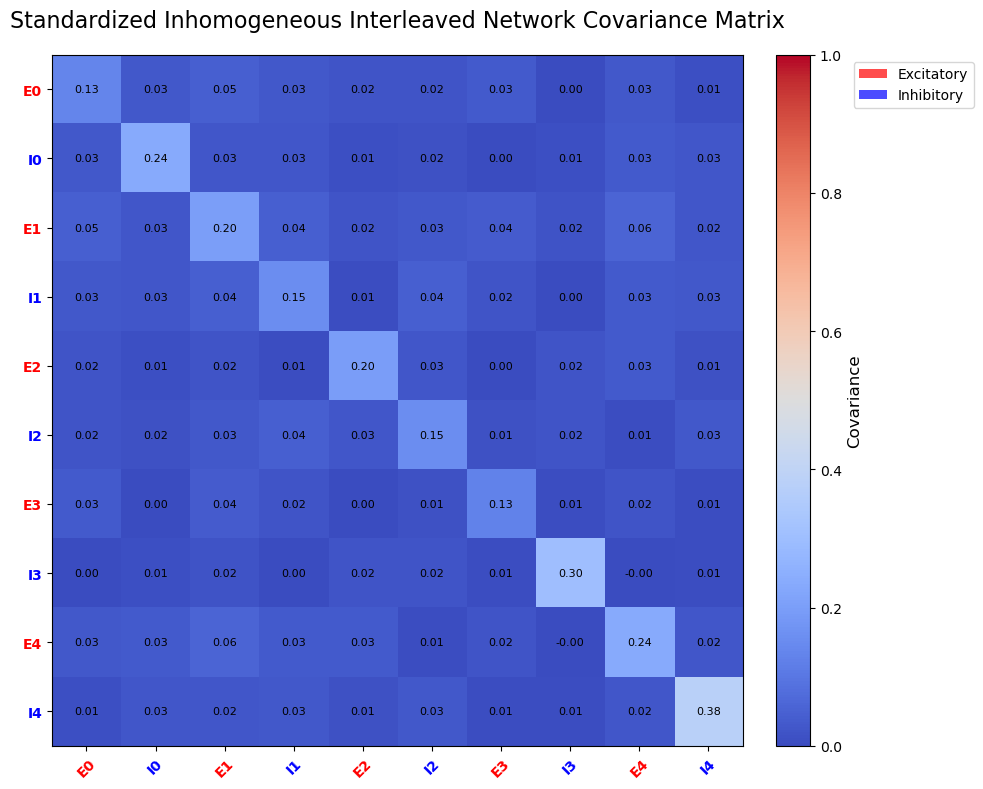

In [959]:
plot_covariance_matrix(cov_matrix_interleaved_emp, normalize=False, title="Standardized Inhomogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels_emp)

In [864]:
random_data, rand_labels, rand_types = create_random_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nRandom dataset shape: {random_data.shape}")
print(f"Neuron labels: {rand_labels}")
print(f"Neuron types: {rand_types}")

random_data_emp, rand_labels_emp, rand_types_emp = create_random_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nRandom Empirical dataset shape: {random_data_emp.shape}")
print(f"Neuron Empirical labels: {rand_labels_emp}")
print(f"Neuron Empirical types: {rand_types_emp}")


Random dataset shape: (10, 99900)
Neuron labels: ['I3', 'E5', 'E8', 'I1', 'I5', 'I0', 'E0', 'I8', 'E1', 'E7']
Neuron types: ['I', 'E', 'E', 'I', 'I', 'I', 'E', 'I', 'E', 'E']

Random Empirical dataset shape: (10, 99800)
Neuron Empirical labels: ['I3', 'E5', 'E8', 'I1', 'I5', 'I0', 'E0', 'I8', 'E1', 'E7']
Neuron Empirical types: ['I', 'E', 'E', 'I', 'I', 'I', 'E', 'I', 'E', 'E']


In [907]:
cov_matrix_random = cov_standardized_data(random_data)
cov_matrix_random_emp = cov_standardized_data(random_data_emp)

array([[0.3149224 , 0.01578692, 0.03347708, 0.00075984, 0.00703095,
        0.00759254, 0.00448093, 0.01578696, 0.02514676, 0.0218944 ],
       [0.01578692, 0.20350109, 0.01942541, 0.03064156, 0.02648155,
        0.0410151 , 0.02848358, 0.01464081, 0.05168498, 0.05832101],
       [0.03347708, 0.01942541, 0.14522498, 0.02987906, 0.01855559,
        0.02531306, 0.01748655, 0.03410971, 0.0343296 , 0.03791687],
       [0.00075984, 0.03064156, 0.02987906, 0.15837439, 0.01970627,
        0.02574123, 0.03363481, 0.01339459, 0.05010674, 0.03105502],
       [0.00703095, 0.02648155, 0.01855559, 0.01970627, 0.13654817,
        0.04455161, 0.02436256, 0.01270102, 0.03962613, 0.03580913],
       [0.00759254, 0.0410151 , 0.02531306, 0.02574123, 0.04455161,
        0.23258716, 0.03945383, 0.03564395, 0.03419063, 0.04333938],
       [0.00448093, 0.02848358, 0.01748655, 0.03363481, 0.02436256,
        0.03945383, 0.13307945, 0.01268534, 0.04529843, 0.0221068 ],
       [0.01578696, 0.01464081, 0.0341097

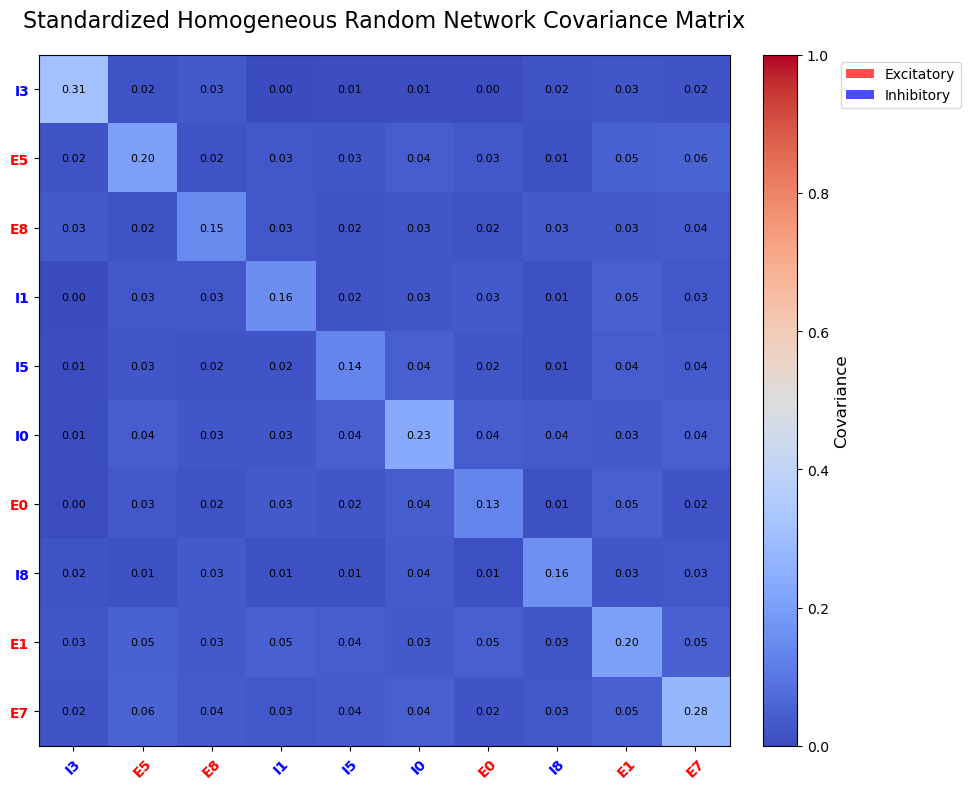

In [955]:
plot_covariance_matrix(cov_matrix_random, normalize=False, title="Standardized Homogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels)

array([[0.30129135, 0.00506247, 0.02337091, 0.00031798, 0.00801529,
        0.00871501, 0.00058708, 0.01585217, 0.01747296, 0.01020364],
       [0.00506247, 0.19457912, 0.01963951, 0.01764961, 0.02155108,
        0.03367391, 0.02838584, 0.00561086, 0.0514153 , 0.05887562],
       [0.02337091, 0.01963951, 0.14724258, 0.02316365, 0.01128816,
        0.01358473, 0.01728614, 0.02690059, 0.03461222, 0.0382655 ],
       [0.00031798, 0.01764961, 0.02316365, 0.15494969, 0.01970987,
        0.02613101, 0.02766216, 0.01353555, 0.0431935 , 0.02321548],
       [0.00801529, 0.02155108, 0.01128816, 0.01970987, 0.13632485,
        0.04490295, 0.01598787, 0.01300001, 0.03044778, 0.02400086],
       [0.00871501, 0.03367391, 0.01358473, 0.02613101, 0.04490295,
        0.23702875, 0.02919098, 0.03629146, 0.02578375, 0.03176263],
       [0.00058708, 0.02838584, 0.01728614, 0.02766216, 0.01598787,
        0.02919098, 0.13322035, 0.00459118, 0.04547645, 0.02217494],
       [0.01585217, 0.00561086, 0.0269005

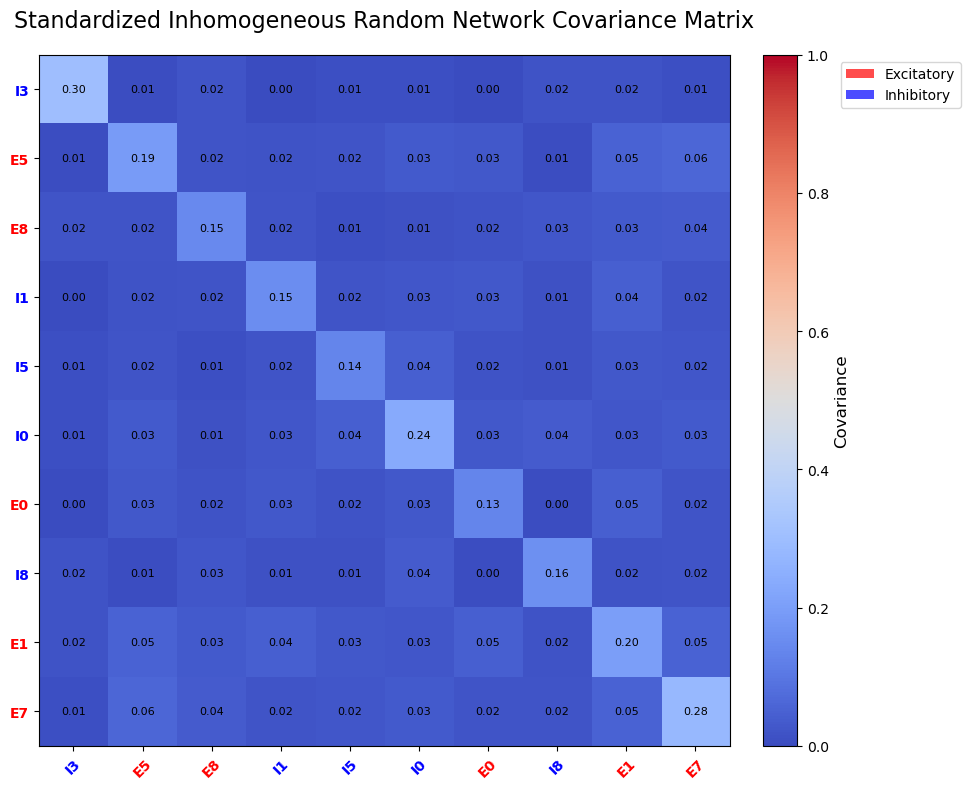

In [957]:
plot_covariance_matrix(cov_matrix_random_emp, normalize=False, title="Standardized Inhomogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels_emp)

Plots of raw counts, excitatory counts, and inhibitory counts centered and standardized.

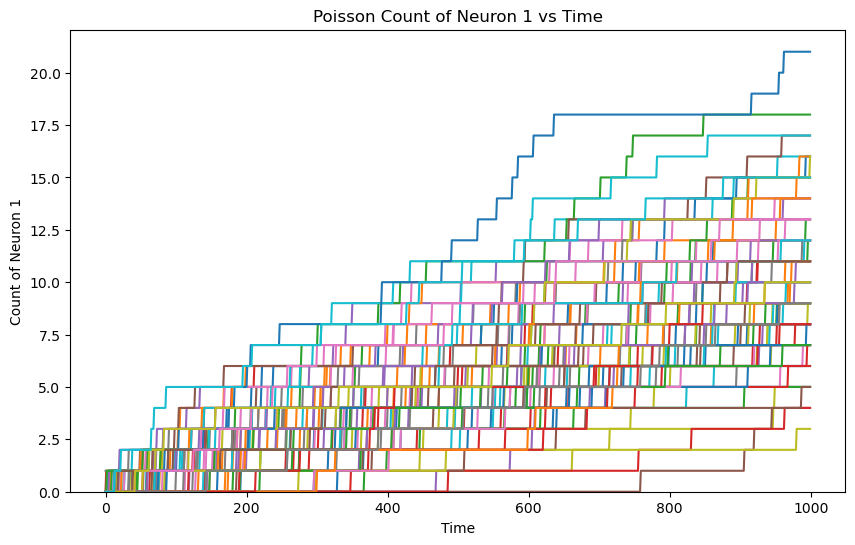

In [869]:
# plot_count_neuron1_vs_time(random_samples, num_samples = 5)
plot_count_neuron1_vs_time(count, num_samples, title = 'Poisson Count of Neuron 1 vs Time')

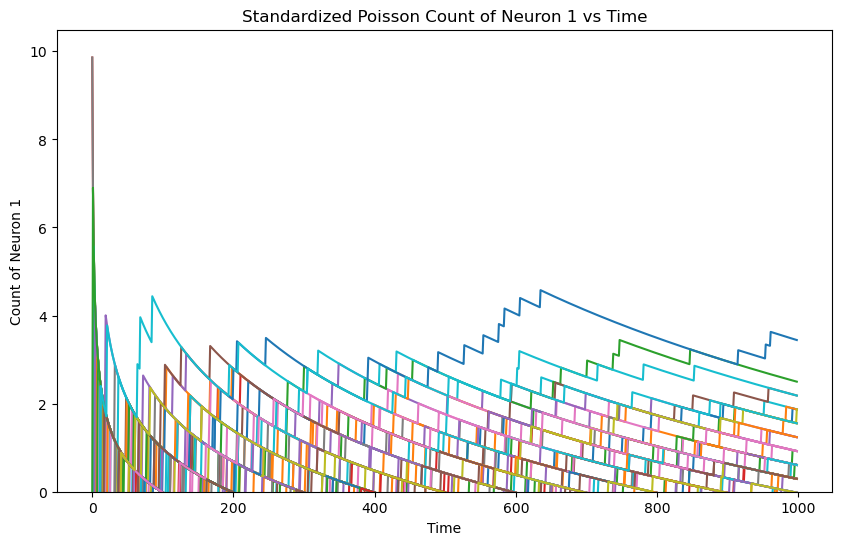

In [870]:
plot_count_neuron1_vs_time(stands, num_samples, title = 'Standardized Poisson Count of Neuron 1 vs Time')

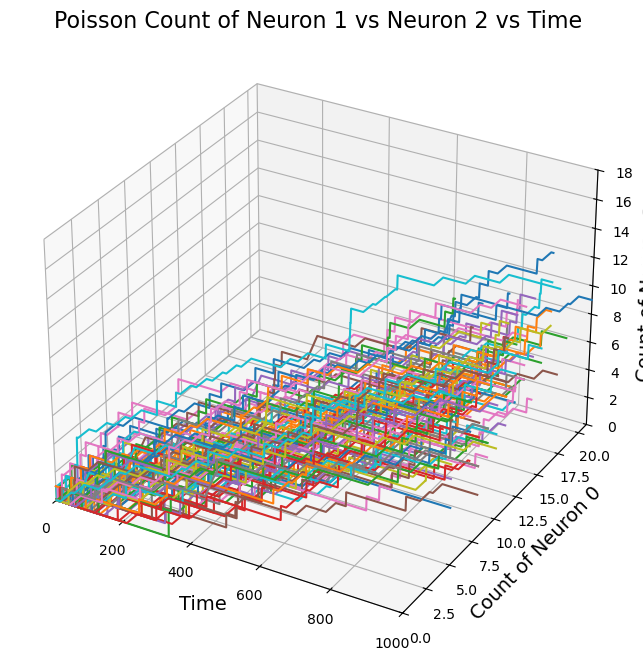

In [871]:
plot_count_neuron1_vs_neuron2_vs_time(count, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Poisson Count of Neuron 1 vs Neuron 2 vs Time' )

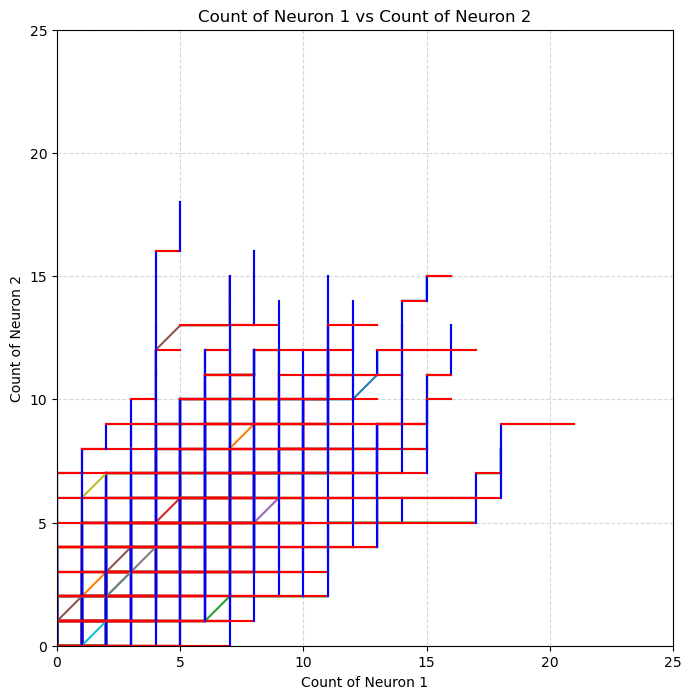

In [872]:
plot_count_neuron1_vs_count_neuron2(count, num_samples)

In [873]:
# plot_count_neuron1_vs_count_neuron2_vs_count_neuron3(count, num_samples)

In [874]:
# combined_poisson_plot(spike_train, count, theoretical_means, empirical_mean, colors=None, figsize=(12, 10))

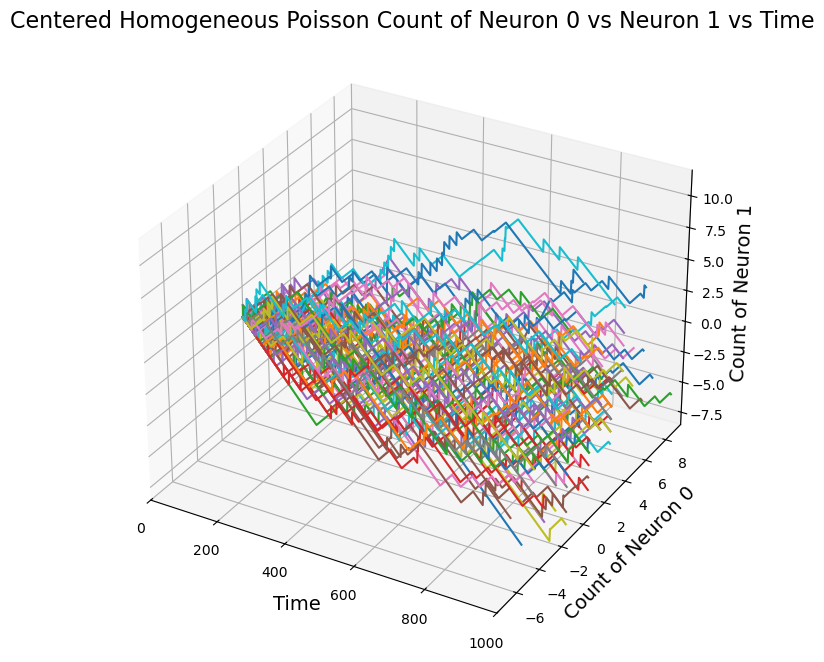

In [875]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time' )

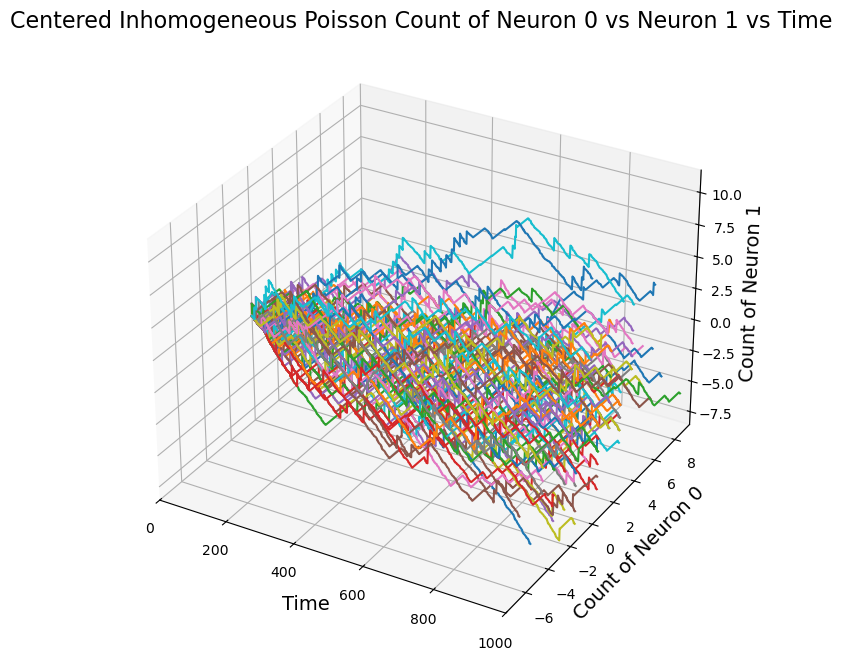

In [876]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:8: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:9: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neu

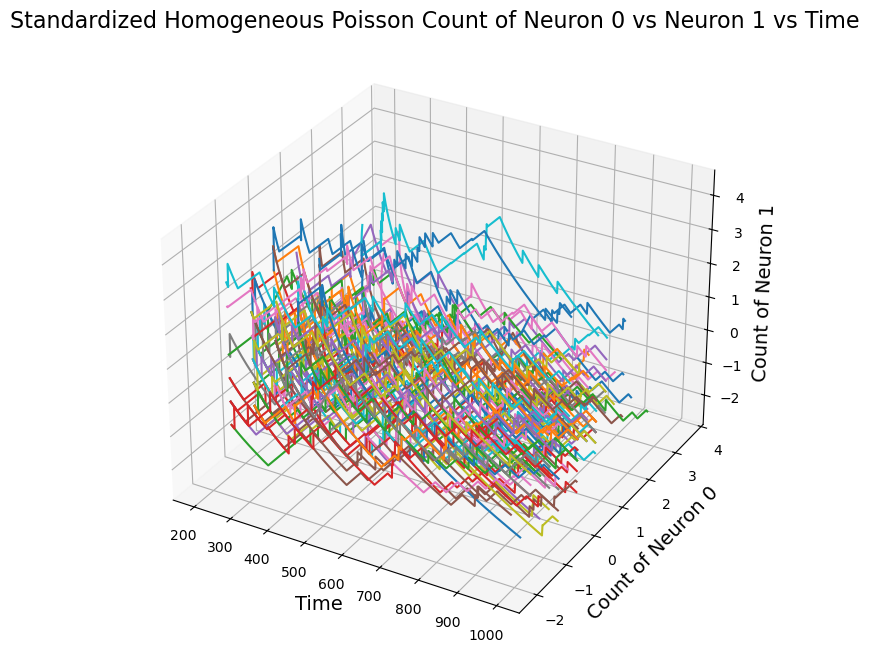

In [877]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

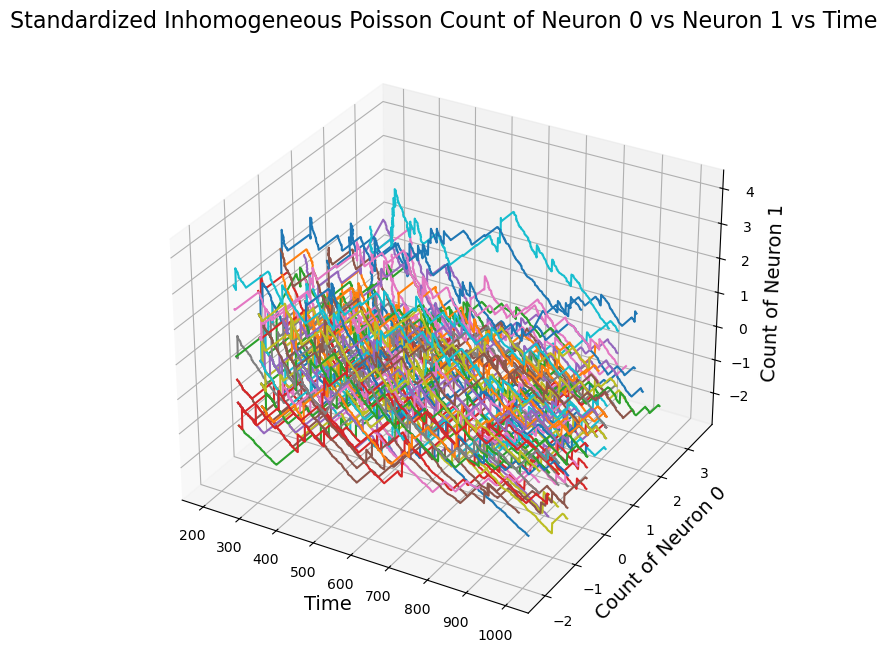

In [878]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

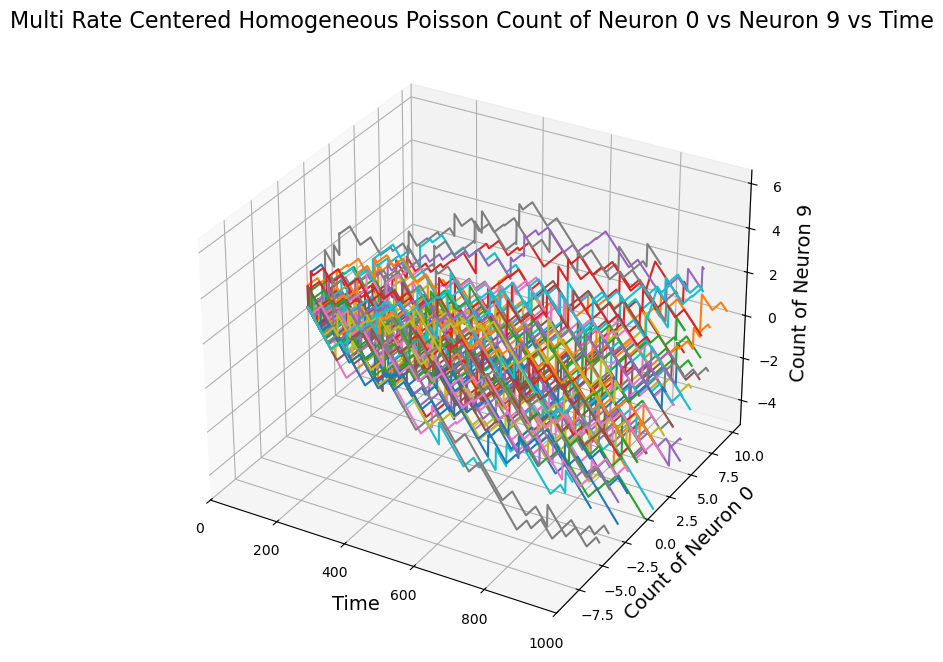

In [879]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

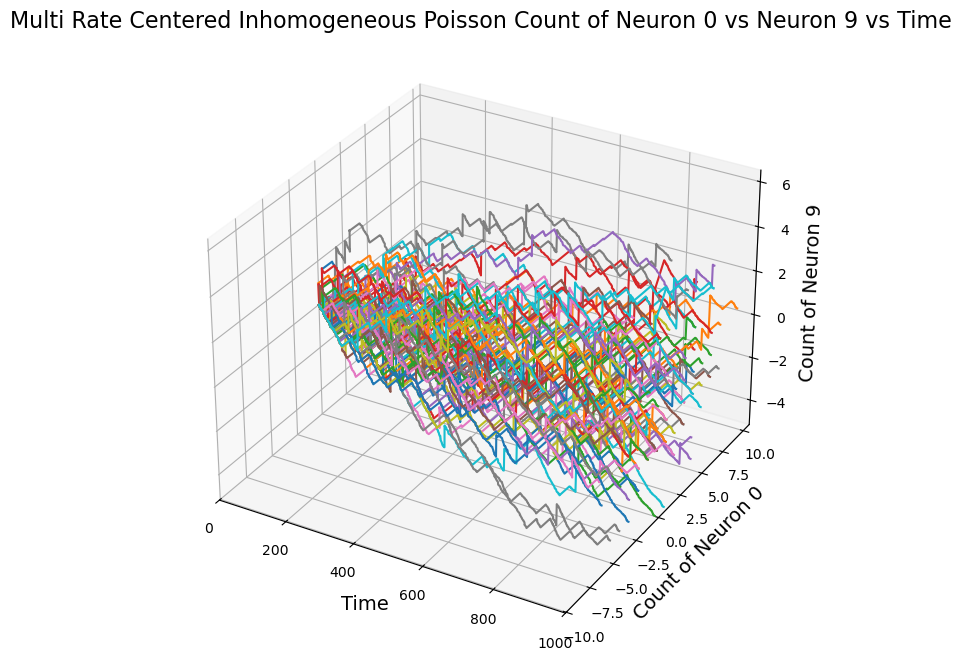

In [880]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:8: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:9: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neu

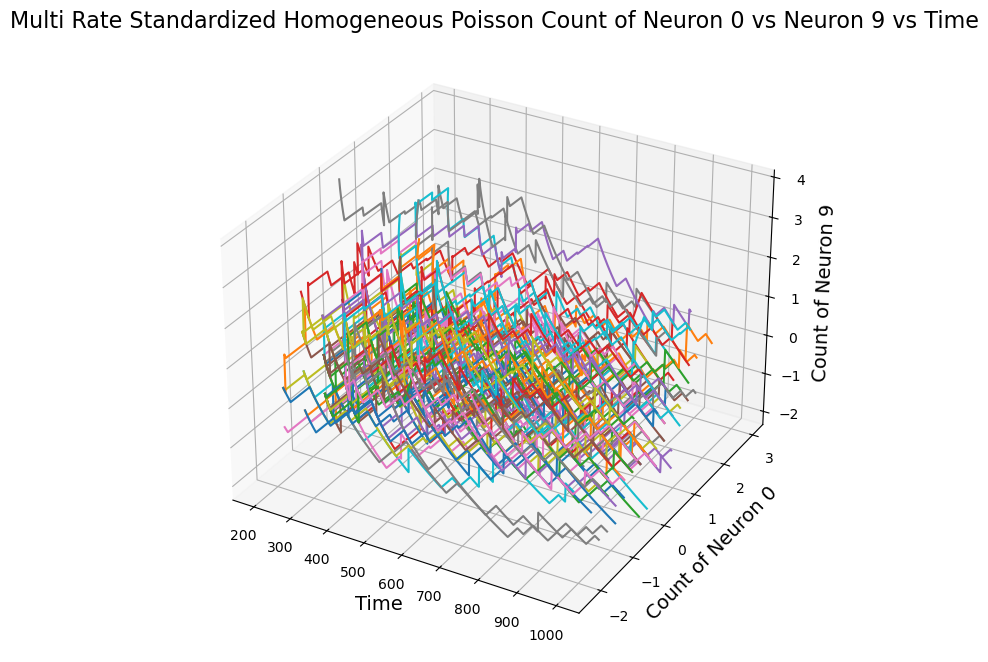

In [881]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

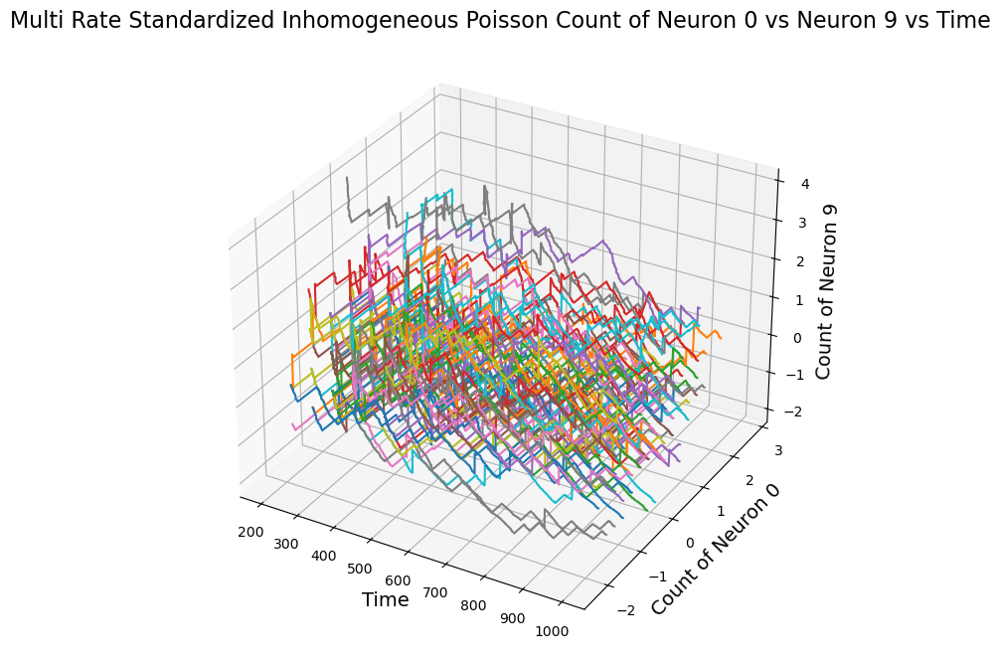

In [882]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

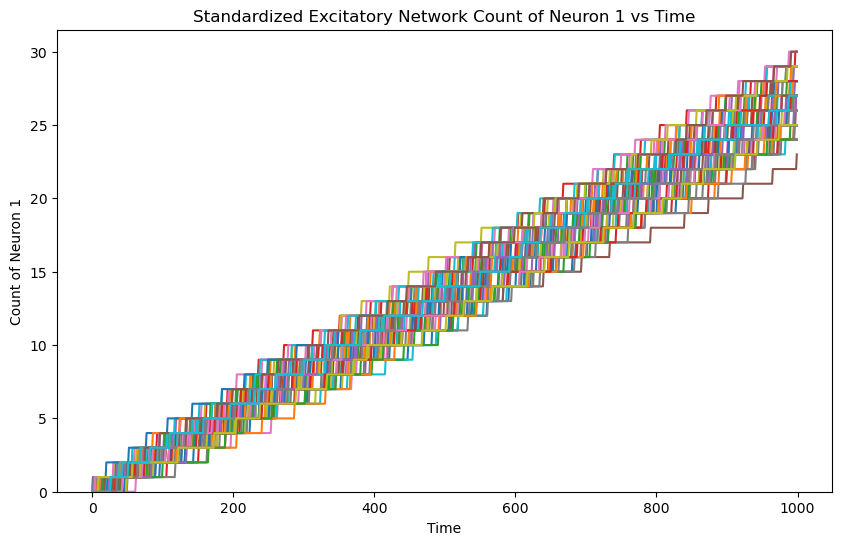

In [883]:
#plot_count_neuron1_vs_time(random_samples_ex, num_samples = 5)
plot_count_neuron1_vs_time(count_ex, num_samples, title = 'Standardized Excitatory Network Count of Neuron 1 vs Time')

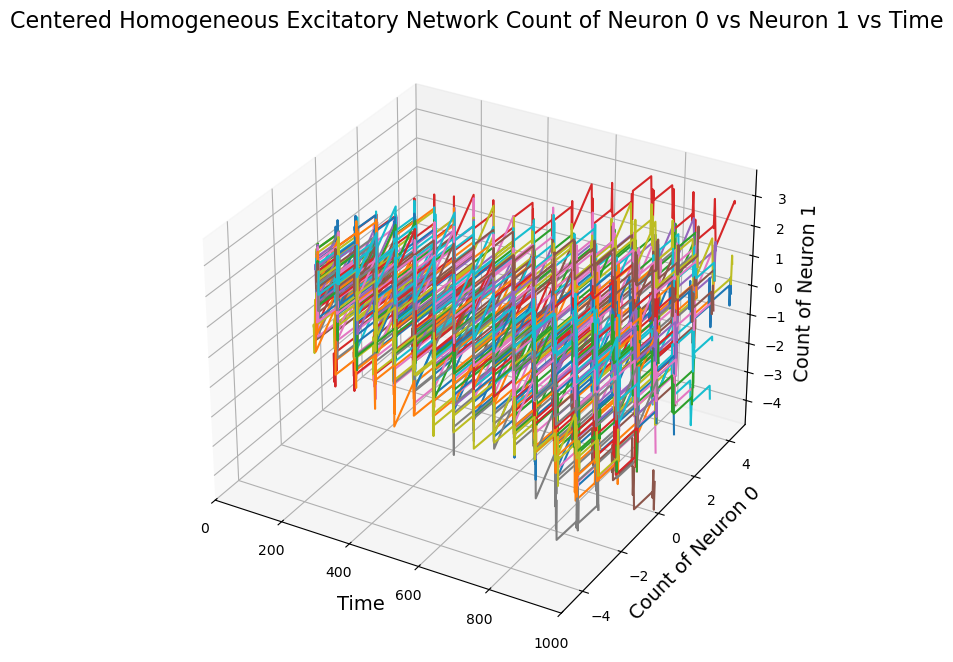

In [884]:
#plot_centered_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

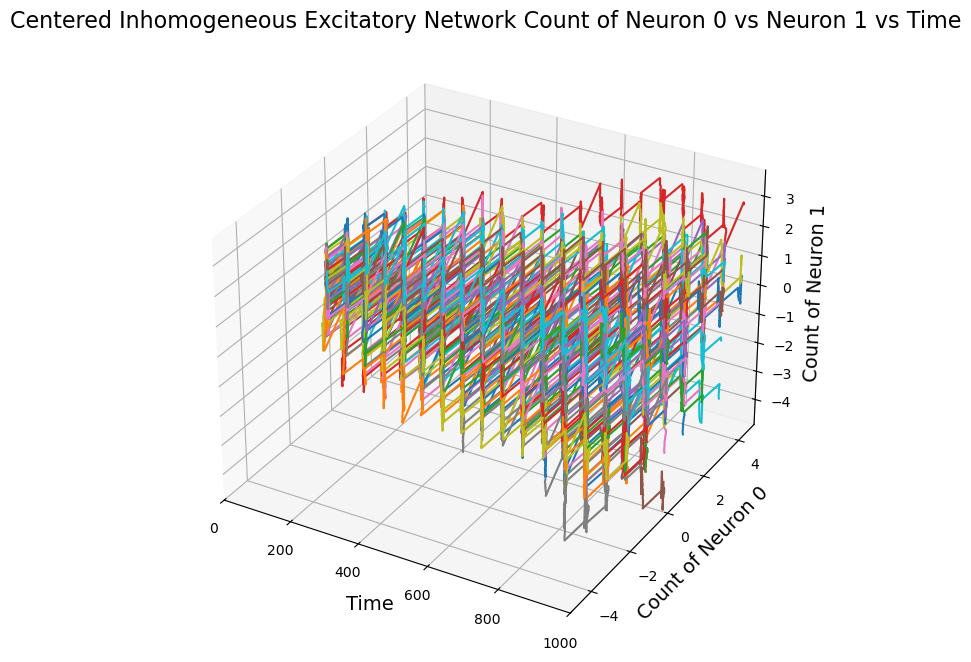

In [885]:
#plot_centered_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]


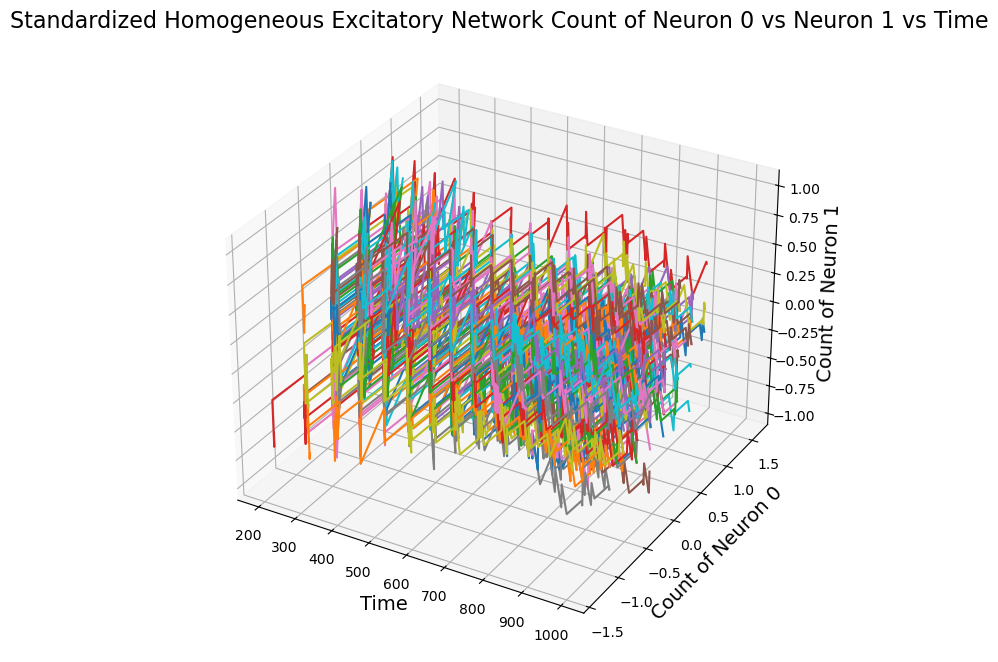

In [886]:
#plot_standardized_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]


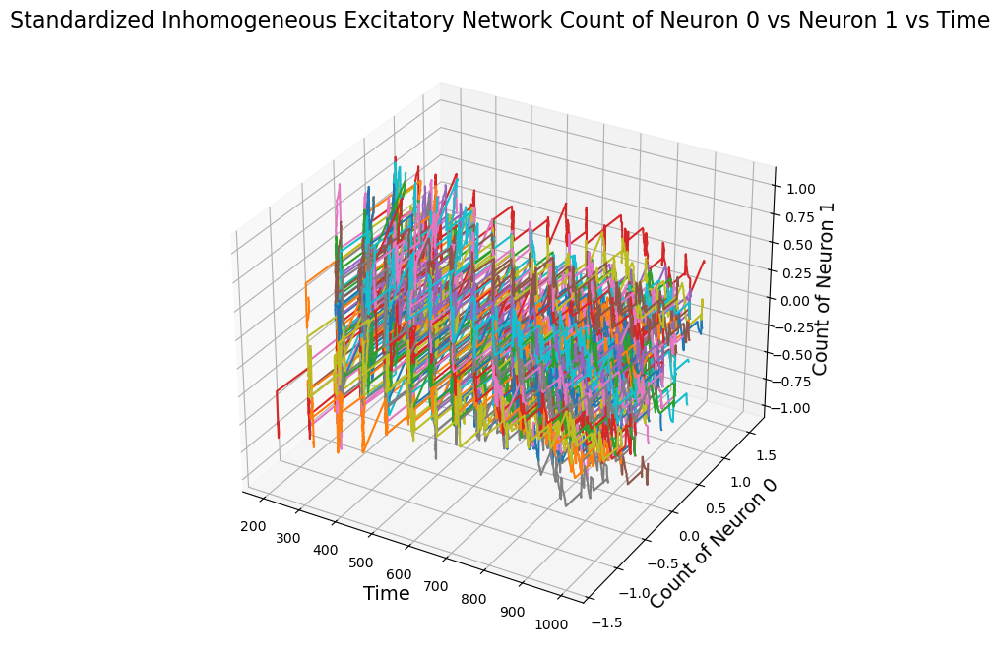

In [887]:
#plot_standardized_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

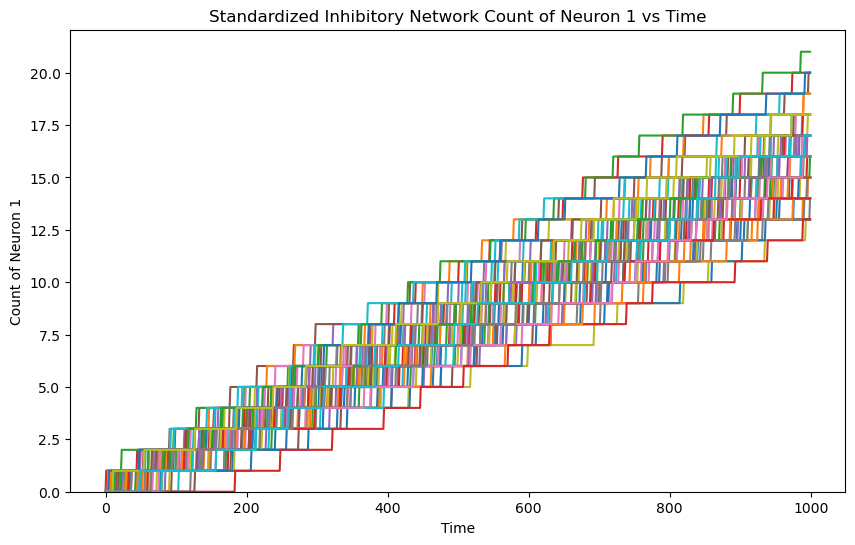

In [888]:
#plot_count_neuron1_vs_time(random_samples_in, num_samples = 5)
plot_count_neuron1_vs_time(count_in, num_samples, title = 'Standardized Inhibitory Network Count of Neuron 1 vs Time')

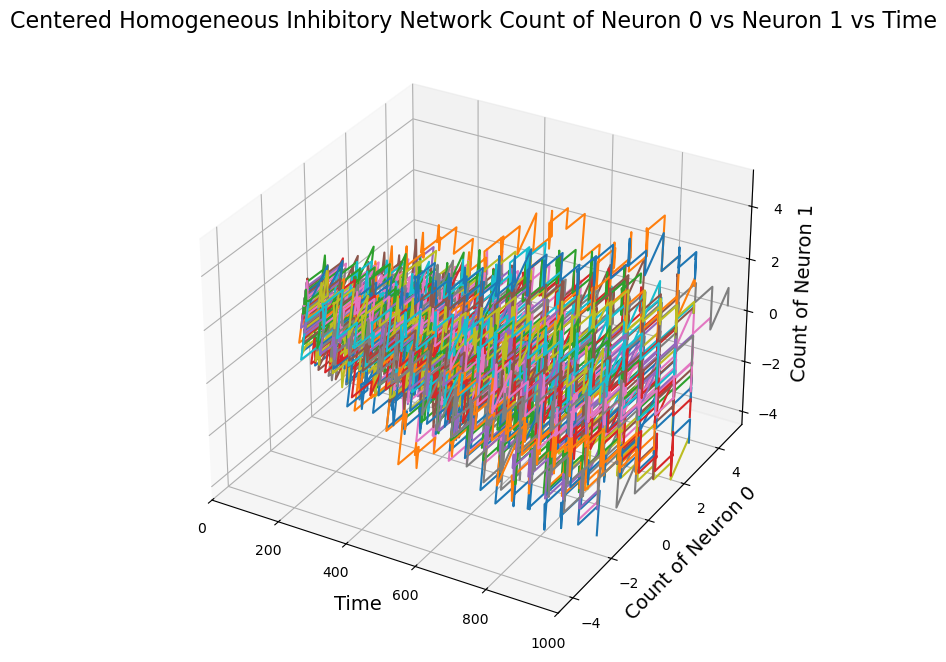

In [889]:
#plot_centered_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples= 5)
plot_centered_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

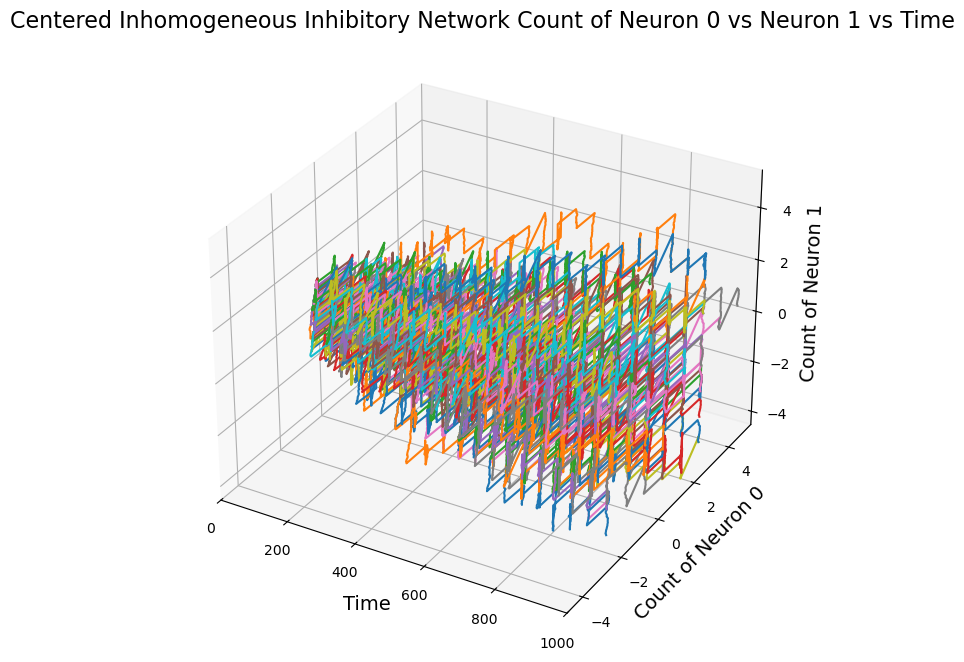

In [890]:
#plot_centered_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, num_samples= 5)
plot_centered_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:9: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]


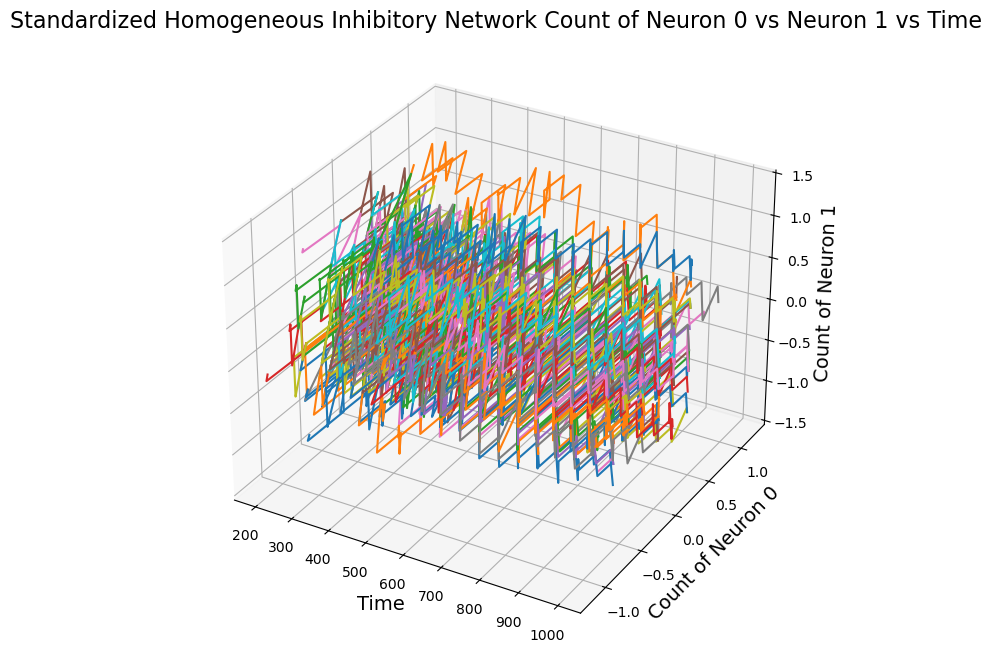

In [891]:
#plot_standardized_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_14480\2676328115.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]


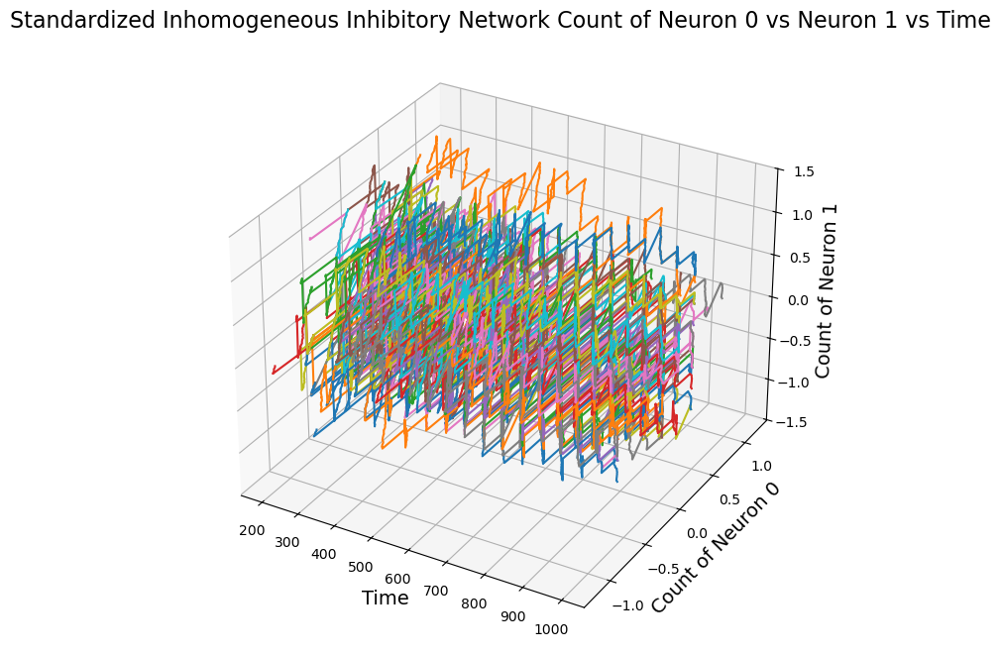

In [892]:
#plot_standardized_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Poisson Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

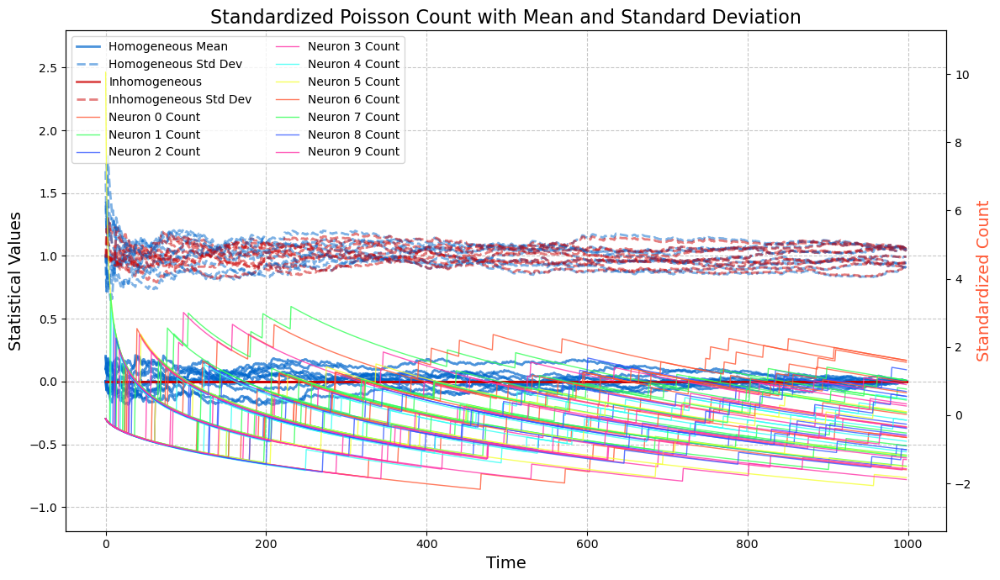

In [893]:
data_plot(stands, num_samples, standardized_mean, standardized_mean_emp, 
              standardized_std, standardized_std_emp, num_neurons, title= 'Standardized Poisson Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Exctitatory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

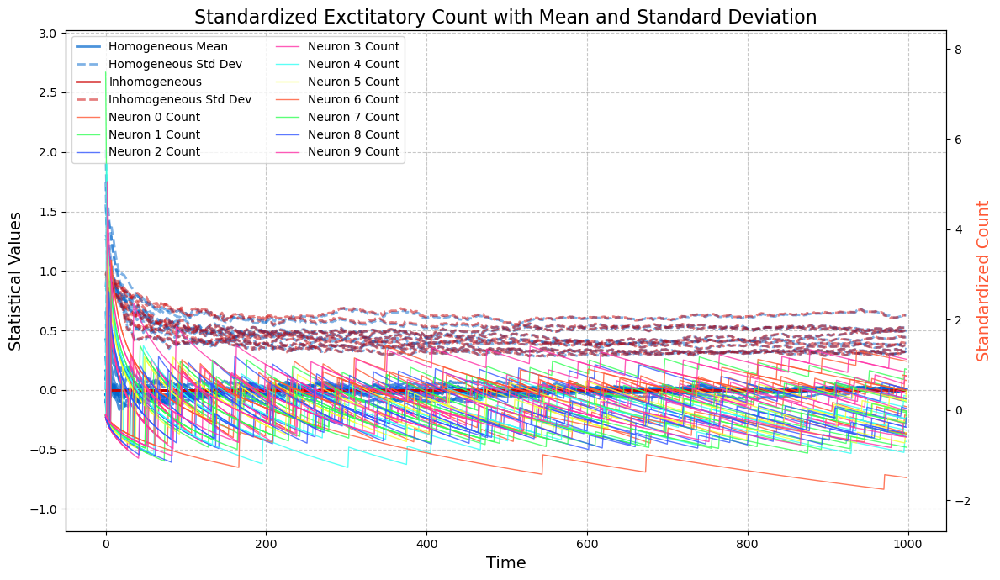

In [894]:
data_plot(stands_ex, num_samples, standardized_mean_ex, standardized_mean_ex_emp, 
              standardized_std_ex, standardized_std_ex_emp, num_neurons, title='Standardized Exctitatory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Inhibitory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

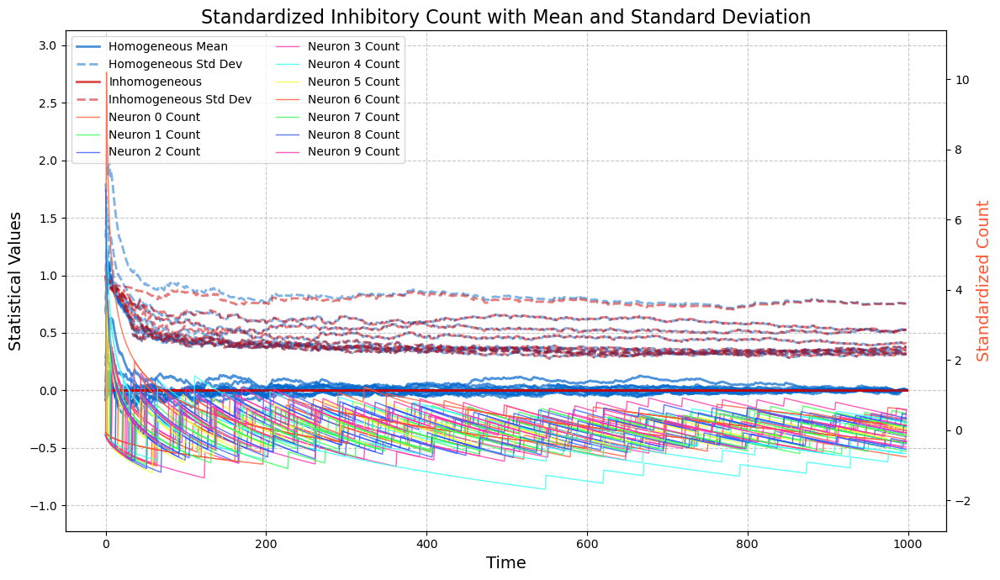

In [895]:
data_plot(stands_in, num_samples, standardized_mean_in, standardized_mean_in_emp, 
              standardized_std_in, standardized_std_in_emp, num_neurons, title='Standardized Inhibitory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)